# Дискретные случайные процессы и временные ряды, DS-поток
## Задание TS.3
### Временные ряды. Модели типа ARIMA.

**Правила:**

* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds24_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания получат штраф.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* В каждой задаче не забывайте делать **пояснения и выводы**.
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком *или*
    * вставив ее в ноутбук посредством `Edit -> Insert Image` (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). <font color="red"><b>Неправильно вставленные фотографии могут не передаться при отправке.</b></font> Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* В решениях поясняйте, чем вы пользуетесь, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.


**Баллы за задание.** 
  * Задача 1 &mdash; 150 баллов.

In [1]:
# Bot check

# HW_ID: ds_ts3
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: not final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

In [2]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import scipy.stats as sps
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error

from statsforecast import models as sf_models
from statsforecast.models import (
    SimpleExponentialSmoothing,
    SimpleExponentialSmoothingOptimized,
)

import statsmodels
import statsmodels.api as sm

from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.holtwinters import (
    ExponentialSmoothing,
    SimpleExpSmoothing,
    Holt,
)
import itertools

import seaborn as sns
import pylab as plt
import plotly.graph_objects as go
from IPython.display import display, HTML
from pylab import rcParams
from tqdm import tqdm

import os
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAXResults
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA
from statsforecast.arima import arima_string
import pmdarima as pm
from tbats import TBATS, BATS

from prophet import Prophet
%matplotlib inline

sns.set(palette="Set2", font_scale=1.2)

In [3]:

%matplotlib inline

sns.set(palette="Set2", font_scale=1.2)

In [4]:
colors = list(["#00cc96", "#d62728", "#9467bd", "#8c564b"])

### Задача 1

__1.__ Загрузите файл `electricity.csv` (<a href="https://rdrr.io/cran/stR/man/electricity.html">источник</a>) c информацией о максимальном спросе на электричество (`Consumption`) в штате Виктория (Австралия) за 30-минутные интервалы с 10 января 2000 в течении 115 дней, а так же информация о температуре воздуха (`Temperature`) за эти же промежутки времени.

In [5]:
data = pd.read_csv("electricity.csv")

data.head()

,Consumption,Temperature,Time,DailySeasonality,WeeklySeasonality,WorkingDaySeasonality
0,3853.475392,20.90,0,0,48,0
1,3683.014105,20.70,1,1,49,1
2,3912.324031,20.50,2,2,50,2
3,3783.881181,20.05,3,3,51,3
4,3554.257244,19.60,4,4,52,4


__2.__ Нарисуйте графики временных рядов температуры и потребления электричества. Верно ли, что спрос на электричество зависит от температуры воздуха? Для ответа на вопрос используйте коэффициенты корреляции, учитывая условия их применимости.

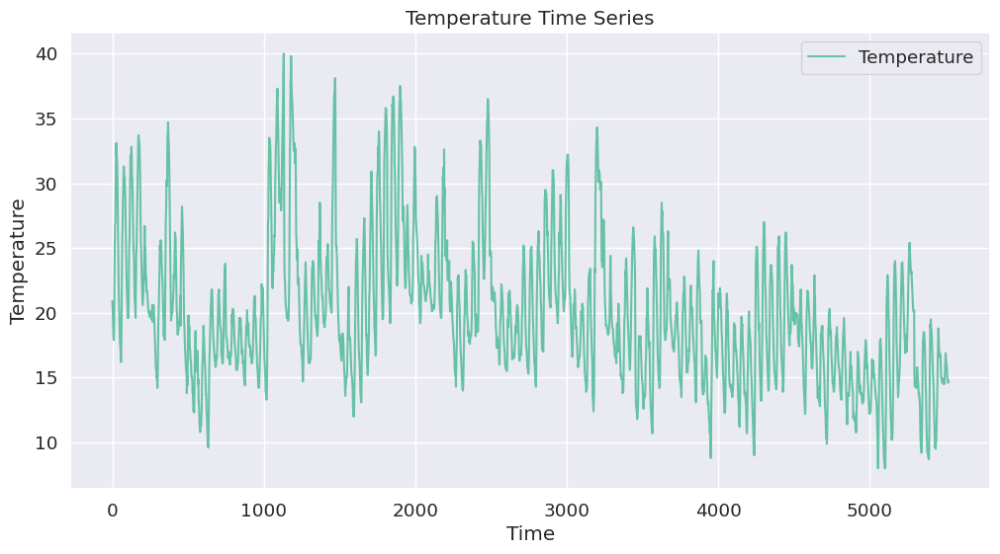

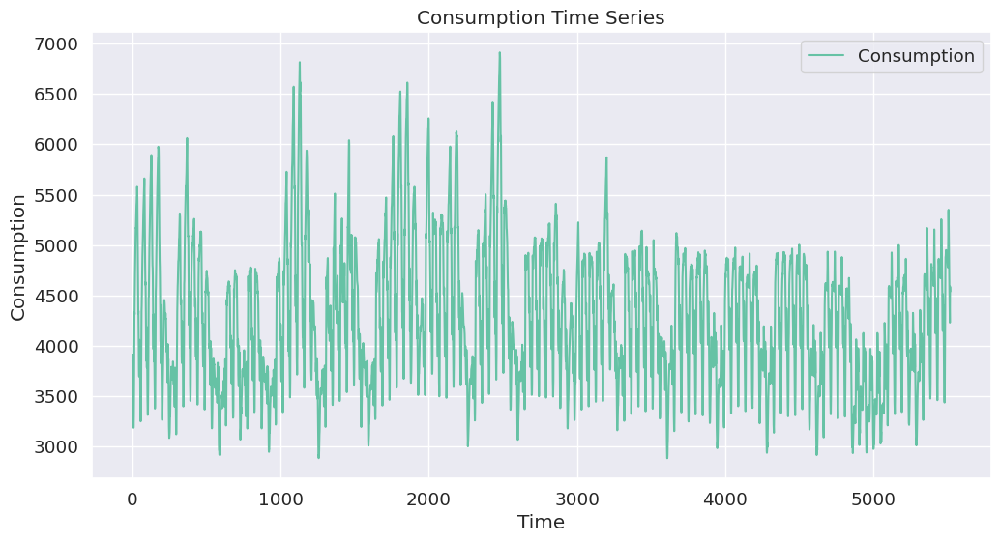

In [6]:
plt.figure(figsize=(12, 6))
plt.plot(data["Temperature"], label="Temperature")
plt.xlabel("Time")
plt.ylabel("Temperature")
plt.title("Temperature Time Series")
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(data["Consumption"], label="Consumption")
plt.xlabel("Time")
plt.ylabel("Consumption")
plt.title("Consumption Time Series")
plt.legend()
plt.show()

Из графиков видим, что чем вышем температура, тем больше потребляется электроэнергии. Чтобы подтвердить эту зависимость посмотрим на коэффициенты корреляции.

In [7]:
correlation_matrix = data[["Temperature", "Consumption"]].corr(method='pearson')

print(correlation_matrix)

             Temperature  Consumption
Temperature     1.000000     0.666558
Consumption     0.666558     1.000000


Как видим, коэффициент корреляции равен 0.66, что говорит о вероятной линейной зависимости величин, что логично, в жаркую погоду люди используют больше электричества.

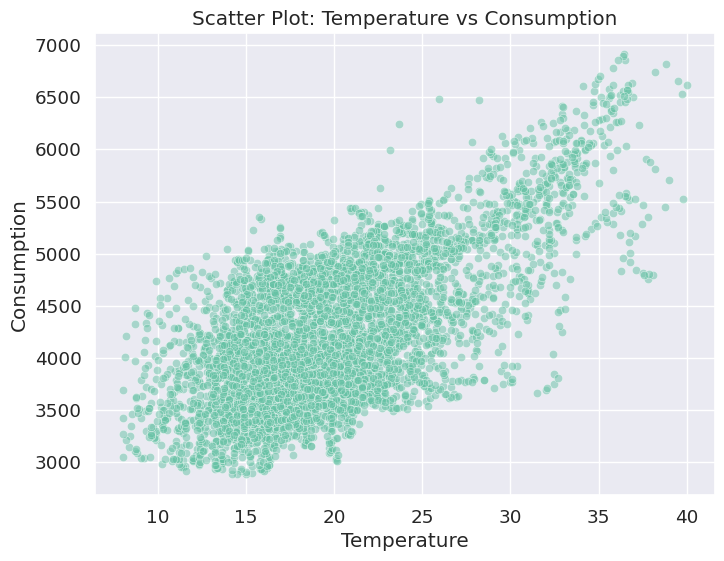

In [8]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data["Temperature"], y=data["Consumption"], alpha=0.5)
plt.xlabel("Temperature")
plt.ylabel("Consumption")
plt.title("Scatter Plot: Temperature vs Consumption")
plt.grid(True)
plt.show()

Scatter plot также говорит о присутствии линейной зависимости.

__3.__ Разделите временной ряд на две части:
данные за последнюю неделю (последние $48\times7$ измерений) назовем тестовыми данными, а все остальное &mdash; обучающими данными.

Столбец время с датафрейме то 30-ти минутные интервалы. Переведем его в обычный Timestamp для удобства.

In [9]:
start_date = pd.Timestamp("2000-01-10")
data["Timestamp"] = start_date + pd.to_timedelta(data["Time"] * 30, unit="m")
data = data.set_index("Timestamp")
data.drop(["Time"], axis=1, inplace=True)

data.head()

,Consumption,Temperature,DailySeasonality,WeeklySeasonality,WorkingDaySeasonality
Timestamp,,,,,
2000-01-10 00:00:00,3853.475392,20.90,0,48,0
2000-01-10 00:30:00,3683.014105,20.70,1,49,1
2000-01-10 01:00:00,3912.324031,20.50,2,50,2
2000-01-10 01:30:00,3783.881181,20.05,3,51,3
2000-01-10 02:00:00,3554.257244,19.60,4,52,4


In [10]:
end_date = data.tail().index[0]
start_date = end_date - pd.Timedelta(days=7)

train_df = data[data.index < start_date]
test_df = data[data.index > start_date]

test_df.head()

,Consumption,Temperature,DailySeasonality,WeeklySeasonality,WorkingDaySeasonality
Timestamp,,,,,
2000-04-26 22:00:00,4023.872303,16.10,44,188,44
2000-04-26 22:30:00,3968.512667,15.65,45,189,45
2000-04-26 23:00:00,4330.536516,15.20,46,190,46
2000-04-26 23:30:00,4317.386273,14.75,47,191,47
2000-04-27 00:00:00,4154.970201,14.30,0,192,0


*Замечание. Пункты c аналитикой выполните для обучающих данных.*

__4__. Сколько типов сезонностей можно выделить в каждом из двух рядов &mdash; спрос на электричество и температура?
С помощью STL-декомпозиции и с помощью декомпозиции, основанной на скользящих средних, в каждом ряде выделите тренд, все типы сезонности, остатки. Сравните 2 метода друг с другом.

Для спроса и температуры можно выделить 3 вида сезонности -- суточную, недельную и рабочий/нерабочий день.

Построим декомпозицию на основе скользящего среднего.

In [11]:
daily_period = train_df["DailySeasonality"].nunique()
weakly_period = train_df["WeeklySeasonality"].nunique()
working_period = train_df["WorkingDaySeasonality"].nunique()

Сначала посмотрим на графики для температуры

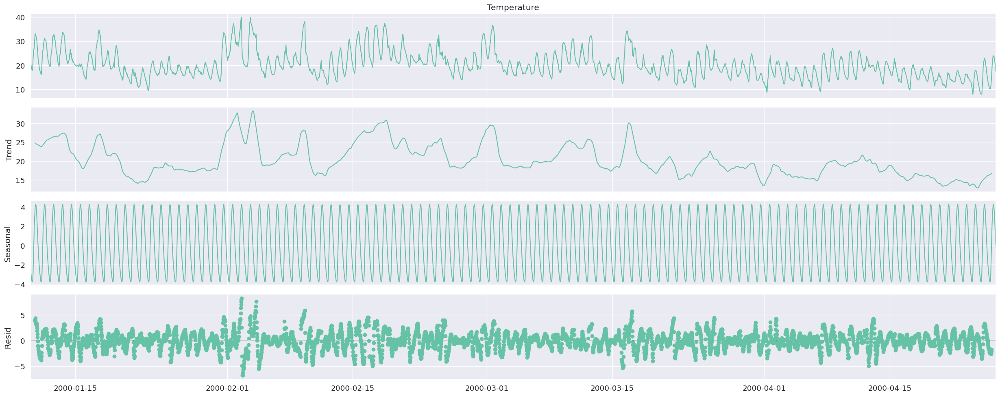

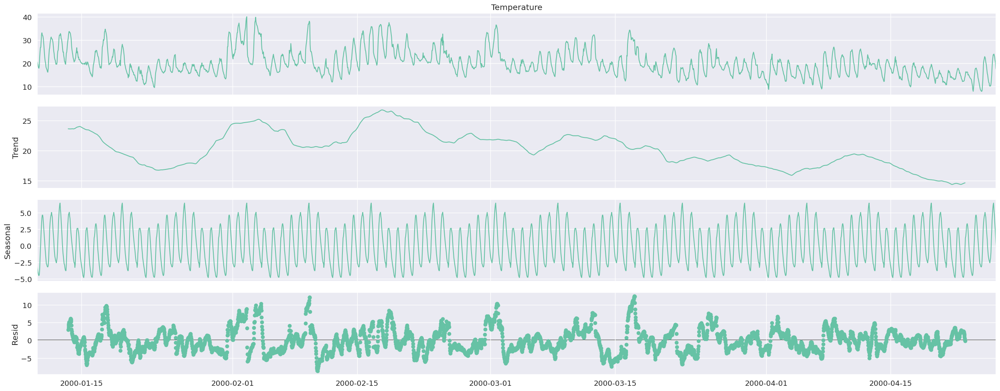

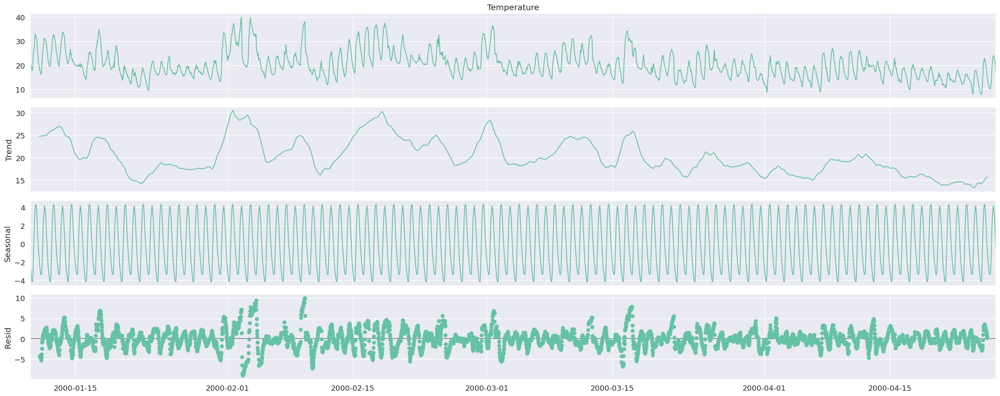

In [12]:
rcParams["figure.figsize"] = 25, 10

temperature_daily_result = seasonal_decompose(train_df["Temperature"], model='additive', period=daily_period)
temperature_daily_result.plot();

temperature_weakly_result = seasonal_decompose(train_df["Temperature"], model='additive', period=weakly_period)
temperature_weakly_result.plot();

temperature_working_result = seasonal_decompose(train_df["Temperature"], model='additive', period=working_period)
temperature_working_result.plot();

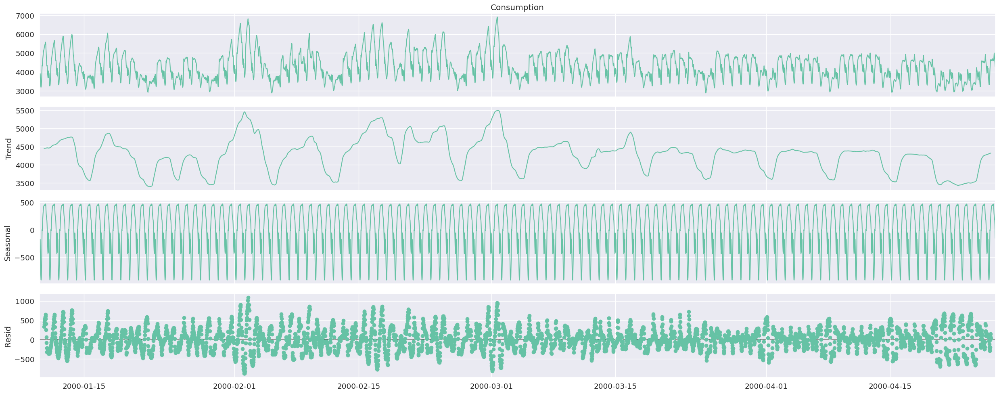

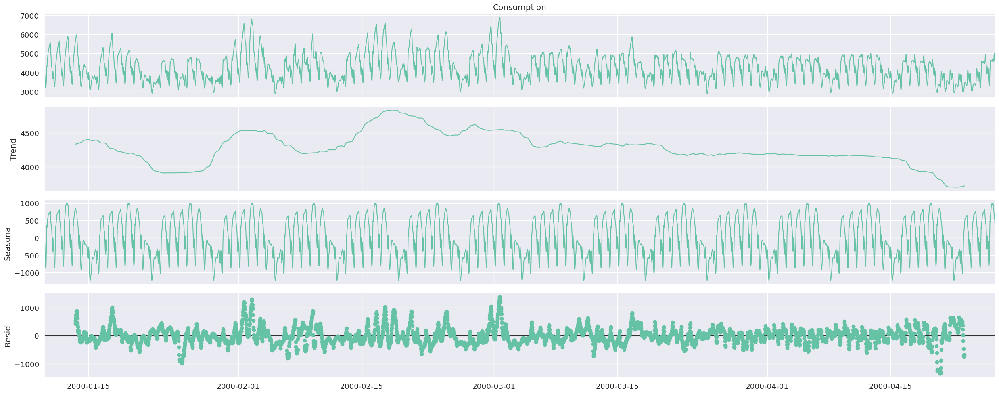

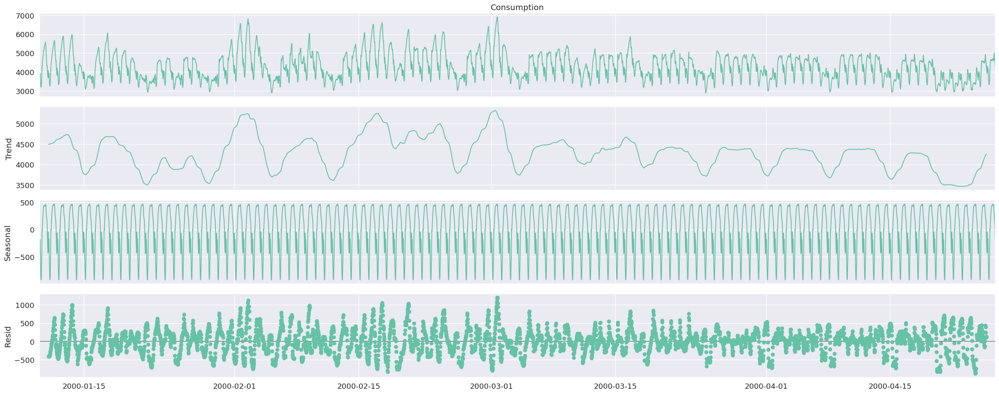

In [13]:
rcParams["figure.figsize"] = 25, 10

consumption_daily_result = seasonal_decompose(train_df["Consumption"], model='additive', period=daily_period)
consumption_daily_result.plot();

consumption_weakly_result = seasonal_decompose(train_df["Consumption"], model='additive', period=weakly_period)
consumption_weakly_result.plot();

consumption_working_result = seasonal_decompose(train_df["Consumption"], model='additive', period=working_period)
consumption_working_result.plot();

Теперь воспользуемся STL.

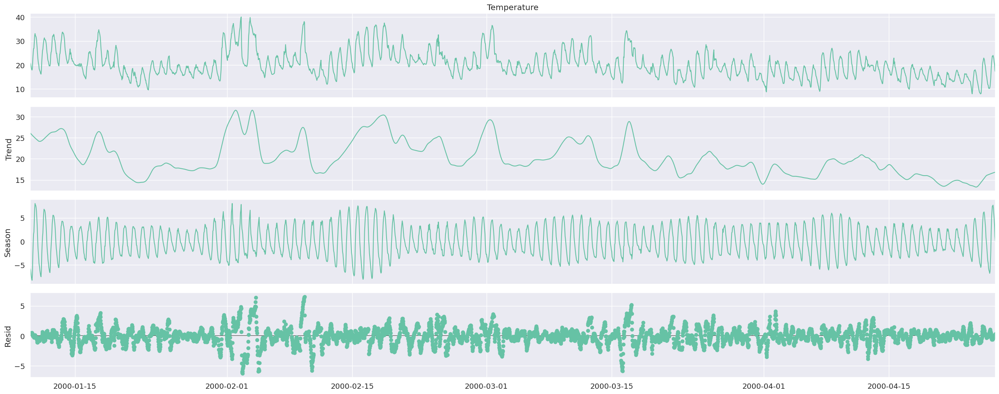

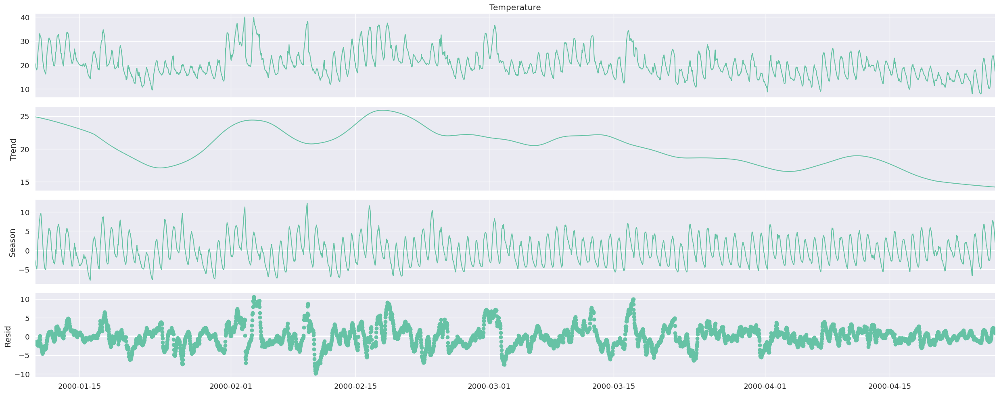

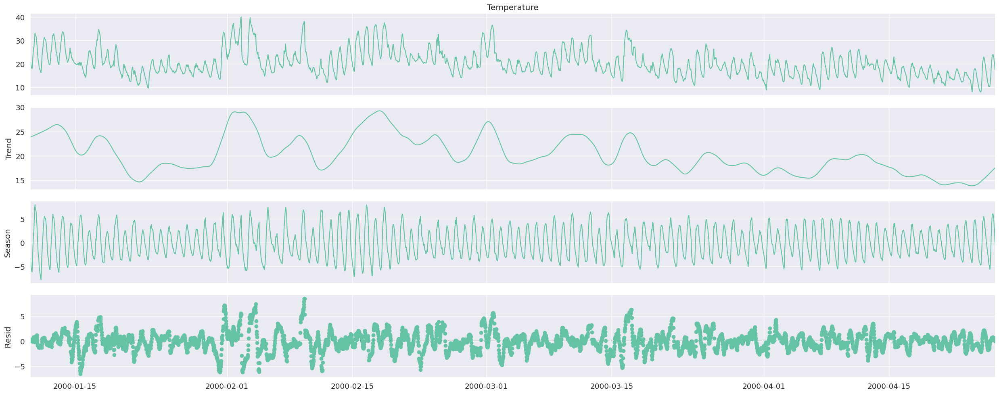

In [14]:
stl_temperature = STL(train_df["Temperature"], period=daily_period)
stl_temperature_result_daily = stl_temperature.fit()
stl_temperature_result_daily.plot()
plt.show()

stl_temperature = STL(train_df["Temperature"], period=weakly_period)
stl_temperature_result_weakly = stl_temperature.fit()
stl_temperature_result_weakly.plot()
plt.show()

stl_temperature = STL(train_df["Temperature"], period=working_period)
stl_temperature_result_working = stl_temperature.fit()
stl_temperature_result_working.plot()
plt.show()


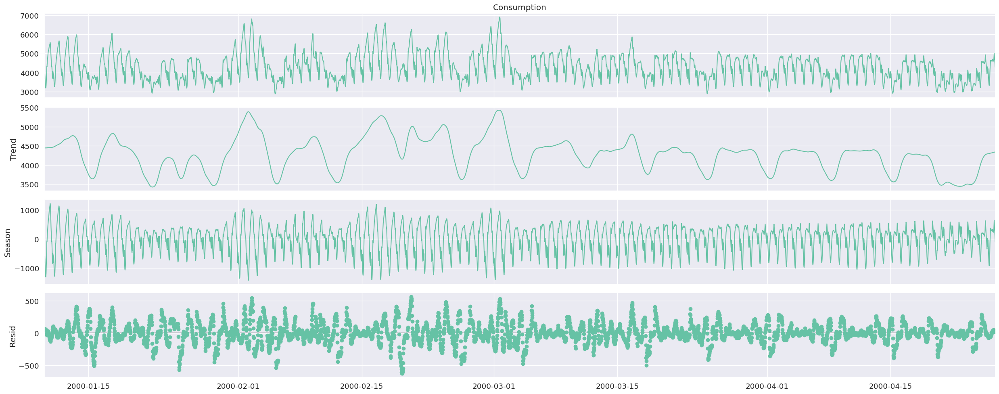

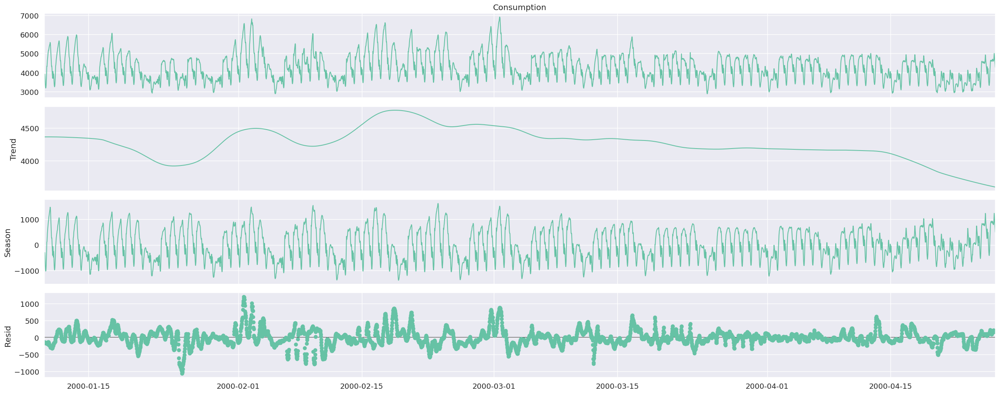

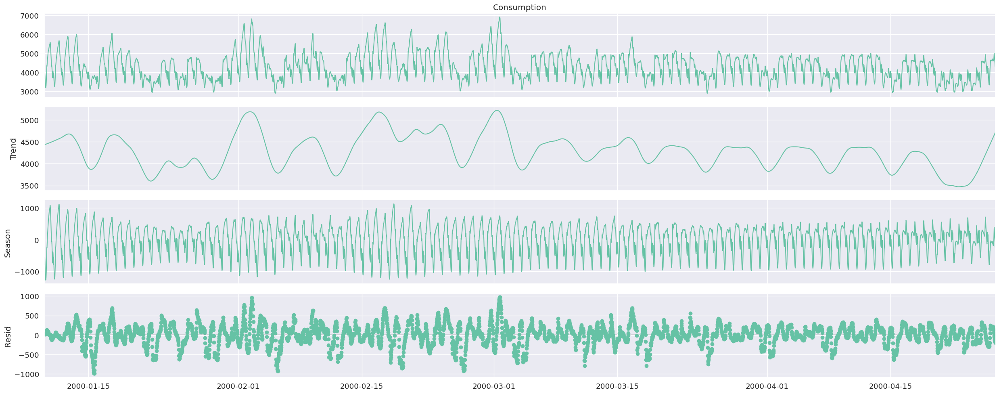

In [15]:
stl_consumption_daily = STL(train_df["Consumption"], period=daily_period)
stl_consumption_result_daily = stl_consumption_daily.fit()
stl_consumption_result_daily.plot()
plt.show()

stl_consumption_weakly = STL(train_df["Consumption"], period=weakly_period)
stl_consumption_result_weakly = stl_consumption_weakly.fit()
stl_consumption_result_weakly.plot()
plt.show()

stl_consumption_working = STL(train_df["Consumption"], period=working_period)
stl_consumption_result_working = stl_consumption_working.fit()
stl_consumption_result_working.plot()
plt.show()

Благодаря изменению сезонной компоненты, ошибки STL в среднем меньше, чем при использовании декомпозиции на основе скользящего среднего.

__5.__ С помощью критериев KPSS и Дики-Фуллера проверьте на стационарность исходные ряды и остатки, полученные после применения STL-декомпозиции. Не забывайте про множественную проверку гипотез.

In [16]:
kpss_pval = kpss(train_df["Consumption"], regression="c")[1]
adfuller_pval = adfuller(train_df["Consumption"], regression="c")[1]

print(f"KPSS p-value для Consumption: {kpss_pval:.3f}")
print(f"ADF p-value для Consumption: {adfuller_pval:.3f}")

kpss_pval_stl_daily = kpss(stl_consumption_result_daily.resid, regression="c")[1]
adfuller_pval_stl_daily = adfuller(stl_consumption_result_daily.resid, regression="c")[1]

print(f"KPSS p-value для STL-декомпозиции (дневная сезонность) остатков Consumption: {kpss_pval_stl_daily:.3f}")
print(f"ADF p-value для STL-декомпозиции (дневная сезонность) остатков Consumption: {adfuller_pval_stl_daily:.3f}")

kpss_pval_stl_weakly = kpss(stl_consumption_result_weakly.resid, regression="c")[1]
adfuller_pval_stl_weakly = adfuller(stl_consumption_result_weakly.resid, regression="c")[1]

print(f"KPSS p-value для STL-декомпозиции (недельная сезонность) остатков Consumption: {kpss_pval_stl_weakly:.3f}")
print(f"ADF p-value для STL-декомпозиции (недельная сезонность) остатков Consumption: {adfuller_pval_stl_weakly:.3f}")

kpss_pval_stl_working = kpss(stl_consumption_result_working.resid, regression="c")[1]
adfuller_pval_stl_working = adfuller(stl_consumption_result_working.resid, regression="c")[1]

print(f"KPSS p-value для STL-декомпозиции (рабочий/нерабочий день) остатков Consumption: {kpss_pval_stl_working:.3f}")
print(f"ADF p-value для STL-декомпозиции (рабочий/нерабочий день) остатков Consumption: {adfuller_pval_stl_working:.3f}")


/tmp/ipykernel_23476/1011066556.py:1: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_pval = kpss(train_df["Consumption"], regression="c")[1]


KPSS p-value для Consumption: 0.010
ADF p-value для Consumption: 0.000


/tmp/ipykernel_23476/1011066556.py:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_pval_stl_daily = kpss(stl_consumption_result_daily.resid, regression="c")[1]


KPSS p-value для STL-декомпозиции (дневная сезонность) остатков Consumption: 0.100
ADF p-value для STL-декомпозиции (дневная сезонность) остатков Consumption: 0.000


/tmp/ipykernel_23476/1011066556.py:13: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_pval_stl_weakly = kpss(stl_consumption_result_weakly.resid, regression="c")[1]


KPSS p-value для STL-декомпозиции (недельная сезонность) остатков Consumption: 0.100
ADF p-value для STL-декомпозиции (недельная сезонность) остатков Consumption: 0.000


/tmp/ipykernel_23476/1011066556.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_pval_stl_working = kpss(stl_consumption_result_working.resid, regression="c")[1]


KPSS p-value для STL-декомпозиции (рабочий/нерабочий день) остатков Consumption: 0.100
ADF p-value для STL-декомпозиции (рабочий/нерабочий день) остатков Consumption: 0.000


Гипотеза о стационарности исходного ряда отвергается обоими критериями.

Гипотеза о стационарности остатков овергается только критерием Дики-Фуллера.

In [17]:
from statsmodels.stats.multitest import multipletests

In [18]:
kpss_pval_temp = kpss(train_df["Temperature"], regression="c")[1]
adfuller_pval_temp = adfuller(train_df["Temperature"], regression="c")[1]

kpss_pval_stl_temp_daily = kpss(stl_temperature_result_daily.resid, regression="c")[1]
adfuller_pval_stl_temp_daily = adfuller(stl_temperature_result_daily.resid, regression="c")[1]

kpss_pval_stl_temp_weakly = kpss(stl_temperature_result_weakly.resid, regression="c")[1]
adfuller_pval_stl_temp_weakly = adfuller(stl_temperature_result_weakly.resid, regression="c")[1]

kpss_pval_stl_temp_working = kpss(stl_temperature_result_working.resid, regression="c")[1]
adfuller_pval_stl_temp_working = adfuller(stl_temperature_result_working.resid, regression="c")[1]

pvals = [
    kpss_pval_temp, adfuller_pval_temp,
    kpss_pval_stl_temp_daily, adfuller_pval_stl_temp_daily,
    kpss_pval_stl_temp_weakly, adfuller_pval_stl_temp_weakly,
    kpss_pval_stl_temp_working, adfuller_pval_stl_temp_working
]

result, mth_pvals, *_ = multipletests(pvals, alpha=0.05, method="holm")

results_df = pd.DataFrame({
    "Метод": ["KPSS", "ADF", "KPSS (дневная сезонность)", "ADF (дневная сезонность)",
              "KPSS (недельная сезонность)", "ADF (недельная сезонность)",
              "KPSS (рабочий/нерабочий день)", "ADF (рабочий/нерабочий день)"],
    "p-value": np.array(pvals).round(3),
    "МПГ p-value": np.array(mth_pvals).round(3),
    "Отвергаем гипотезу": result
})

display(results_df)


/tmp/ipykernel_23476/1017237120.py:1: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_pval_temp = kpss(train_df["Temperature"], regression="c")[1]
/tmp/ipykernel_23476/1017237120.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_pval_stl_temp_daily = kpss(stl_temperature_result_daily.resid, regression="c")[1]
/tmp/ipykernel_23476/1017237120.py:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_pval_stl_temp_weakly = kpss(stl_temperature_result_weakly.resid, regression="c")[1]
/tmp/ipykernel_23476/1017237120.py:10: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look

,Метод,p-value,МПГ p-value,Отвергаем гипотезу
0,KPSS,0.010,0.040,True
1,ADF,0.001,0.004,True
2,KPSS (дневная сезонность),0.100,0.300,False
3,ADF (дневная сезонность),0.000,0.000,True
4,KPSS (недельная сезонность),0.100,0.300,False
5,ADF (недельная сезонность),0.000,0.000,True
6,KPSS (рабочий/нерабочий день),0.100,0.300,False
7,ADF (рабочий/нерабочий день),0.000,0.000,True


Помним, KPSS проверяет гипотезу о стационарности ряда, Дики-Фуллер о не стационарности.

Как видим, для остатков мы отвергаем гипотезу о не стационарности остатков и вместе с тем не отвергаем гипотезу о их стационарности, значит монжо предположить, что остатки стационарны.

Для исходного ряды по отвергаем гипотезы и о его стационарности, и о его не стационарности. Значит имеет смысл внимательно следить за его использованием.

__6.__ С помощью экспоненциального сглаживания, модели Хольта и модели Хольта-Уинтерса постройте прогнозы моделей с оптимальными параметрами для *спроса на электричество* на неделю вперед. Как можно выбирать параметр сглаживания $\alpha$? Посчитайте качество прогноза по сравнению с реальными данными на тестовом интервале, используя метрику MSE. Сравните все предсказания.

Посмотрим на наши данные

In [19]:
train_data = train_df["Consumption"]
predict_data = test_df["Consumption"]

start = predict_data.index.min()
end = predict_data.index.max()

In [20]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=train_data.index, y=list(train_data), mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        x=predict_data.index,
        y=list(predict_data),
        mode="lines",
        name="будущее",
    )
)
fig.update_layout(title="title")
fig.show()

Начнем с экспоненциального сглаживания

Параметр $\alpha$ здесь и далее будем выбирать из равномерной сетки

In [21]:
sm_fit1 = SimpleExpSmoothing(
    train_data, initialization_method="heuristic"
).fit(smoothing_level=0.2, optimized=False)

sm_fit2 = SimpleExpSmoothing(
    train_data, initialization_method="heuristic"
).fit(smoothing_level=0.6, optimized=False)

sm_fit3 = SimpleExpSmoothing(
    train_data, initialization_method="estimated"
).fit()

sf_fit1 = SimpleExponentialSmoothing(alpha=0.2).fit(train_data.values)
sf_fit2 = SimpleExponentialSmoothing(alpha=0.6).fit(train_data.values)
sf_fit3 = SimpleExponentialSmoothingOptimized().fit(train_data.values)

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency 30min will be used.

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency 30min will be used.

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency 30min will be used.

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Сделаем прогнозы

In [22]:
sm_fcast1 = sm_fit1.predict(start=start, end=end)
sm_fcast2 = sm_fit2.predict(start=start, end=end)
sm_fcast3 = sm_fit3.predict(start=start, end=end)

sf_fcast1 = sf_fit1.predict(predict_data.size)["mean"]
sf_fcast2 = sf_fit2.predict(predict_data.size)["mean"]
sf_fcast3 = sf_fit3.predict(predict_data.size)["mean"]

Посмотрим на результаты модели.

In [23]:
last_alpha = round(sm_fit3.model.params["smoothing_level"], 2)
sm_labels = ["sm alpha=0.2", "sm alpha=0.6", f"sm alpha={last_alpha}"]

params = ["smoothing_level", "initial_level"]
results = pd.DataFrame(
    index=[r"$\alpha$", r"$l_0$", "SSE", "test MSE"], columns=sm_labels
)

for index in [1, 2, 3]:
    results[sm_labels[index - 1]] = (
        [globals()[f"sm_fit{index}"].params[p] for p in params]
        + [globals()[f"sm_fit{index}"].sse]
        + [mean_squared_error(predict_data, globals()[f"sm_fcast{index}"])]
    )

print("Statsmodels results:\n")
display(results)


print("\nStatsforecast results:\n")
sf_labels = ["sf alpha=0.2", "sf alpha=0.6", f"sf alpha=auto"]
results = pd.DataFrame(index=["test MSE"], columns=sf_labels)
for index in [1, 2, 3]:
    results[sf_labels[index - 1]]["test MSE"] = mean_squared_error(
        predict_data, globals()[f"sf_fcast{index}"]
    )
display(results)

Statsmodels results:



,sm alpha=0.2,sm alpha=0.6,sm alpha=1.0
$\alpha$,2.000000e-01,6.000000e-01,9.950000e-01
$l_0$,3.965522e+03,3.965522e+03,3.965522e+03
SSE,6.099507e+08,1.779816e+08,1.021302e+08
test MSE,4.022301e+05,3.028260e+05,2.868700e+05



Statsforecast results:



,sf alpha=0.2,sf alpha=0.6,sf alpha=auto
test MSE,402230.065077,302825.967538,286939.261293


Как видим, лучше всего результат оказался у модели, гле $\alpha$ определялась автоматически.

Визуализируем полученные результаты.

In [24]:
title = "Потребление электричества в Австралии"
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=train_data.index, y=list(train_data), mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        x=predict_data.index,
        y=list(predict_data),
        mode="lines",
        name="будущее",
    )
)

for index in [1, 2, 3]:
    on_train = globals()[f"sm_fit{index}"].fittedvalues
    on_test = globals()[f"sm_fcast{index}"]

    for dataset_str in ["on_train", "on_test"]:
        dataset = globals()[dataset_str]
        label = dataset_str + ": " + sm_labels[index - 1]
        fig.add_trace(
            go.Scatter(
                x=dataset.index,
                y=list(dataset),
                line=dict(color=colors[index - 1]),
                mode="lines",
                name=label,
            )
        )

fig.update_layout(title="Statsmodels " + title)
fig.show()


for index in [1, 2, 3]:
    on_train = globals()[f"sf_fit{index}"].model_["fitted"]
    on_test = globals()[f"sf_fcast{index}"]

    for dataset_str, x_index in zip(
        ["on_train", "on_test"], [train_data.index, predict_data.index]
    ):
        dataset = globals()[dataset_str]
        label = dataset_str + ": " + sf_labels[index - 1]
        fig.add_trace(
            go.Scatter(
                x=x_index,
                y=list(dataset),
                line=dict(color=colors[index - 1]),
                mode="lines",
                name=label,
            )
        )

fig.update_layout(title="Statsforecast " + title)
fig.show();

Теперь воспользуемся моделью Хольта.

In [25]:
sf_fit1 = sf_models.Holt(season_length=48, error_type="A").fit(train_data.values)
sf_fit2 = sf_models.Holt(season_length=48, error_type="M").fit(train_data.values)

sf_fcast1 = sf_fit1.predict(predict_data.size)["mean"]
sf_fcast2 = sf_fit2.predict(predict_data.size)["mean"]

print("\nStatsforecast results:\n")
sf_labels = ["sf additive", "sf multiplicative"]
sf_params = ["smoothing_level", "smoothing_trend", "smoothing_seasonal"]

results = pd.DataFrame(index=["test MSE"], columns=sf_labels)

for index in [1, 2]:
    model = globals()[f"sf_fit{index}"]
    
    # Добавляем MSE
    results[sf_labels[index - 1]]["test MSE"] = mean_squared_error(predict_data, globals()[f"sf_fcast{index}"])
    
# Отображаем результаты
display(results)


fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=train_data.index, y=list(train_data), mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        x=predict_data.index,
        y=list(predict_data),
        mode="lines",
        name="будущее",
    )
)
for index in [1, 2]:
    on_train = globals()[f"sf_fit{index}"].model_["fitted"]
    on_test = globals()[f"sf_fcast{index}"]

    for dataset_str, x_index in zip(
        ["on_train", "on_test"], [train_data.index, predict_data.index]
    ):
        dataset = globals()[dataset_str]
        label = dataset_str + ": " + sf_labels[index - 1]
        fig.add_trace(
            go.Scatter(
                x=x_index,
                y=list(dataset),
                line=dict(color=colors[index - 1]),
                mode="lines",
                name=label,
            )
        )

fig.update_layout(title="Statsforecast " + title)
fig.show()


Statsforecast results:



,sf additive,sf multiplicative
test MSE,350430.087438,350423.025596


Как видим, вне зависимости от типа ошибки, модели просто присваивают среднее. MSE оказался больше чем при экспоненциальном сглаживании


Построим модель Хольта-Уинтерса. $\alpha$ возьмем автоматически.

In [26]:
sf_fit1 = sf_models.HoltWinters(season_length=48, error_type="A").fit(
    train_data.values
)
sf_fit2 = sf_models.HoltWinters(season_length=48, error_type="M").fit(
    train_data.values
)

sf_fcast1 = sf_fit1.predict(predict_data.size)["mean"]
sf_fcast2 = sf_fit2.predict(predict_data.size)["mean"]

print("\nStatsforecast results:\n")
sf_labels = ["sf additive", "sf multiplicative"]
results = pd.DataFrame(index=["test MSE"], columns=sf_labels)
for index in [1, 2]:
    results[sf_labels[index - 1]]["test MSE"] = mean_squared_error(
        predict_data, globals()[f"sf_fcast{index}"]
    )
display(results)

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=train_data.index, y=list(train_data), mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        x=predict_data.index,
        y=list(predict_data),
        mode="lines",
        name="будущее",
    )
)
for index in [1, 2]:
    on_train = globals()[f"sf_fit{index}"].model_["fitted"]
    on_test = globals()[f"sf_fcast{index}"]

    for dataset_str, x_index in zip(
        ["on_train", "on_test"], [train_data.index, predict_data.index]
    ):
        dataset = globals()[dataset_str]
        label = dataset_str + ": " + sf_labels[index - 1]
        fig.add_trace(
            go.Scatter(
                x=x_index,
                y=list(dataset),
                line=dict(color=colors[index - 1]),
                mode="lines",
                name=label,
            )
        )

fig.update_layout(title="Statsforecast " + title)
fig.show()


Statsforecast results:



,sf additive,sf multiplicative
test MSE,171896.045369,155533.218695


Как видим, и мультипликативный, и аддитивный тип тренда позволил уменьшить MSE. Причем $\alpha$ подбиралось автоматически.

__7.__ Построим модель $\text{SARIMA}$ для предсказания *спроса на электричество*. С помощью преобразований исходного ряда приведите его к стационарному. По графикам ACF и PACF подберите параметры модели $\text{SARIMA}(p, d, q)\times(P, D, Q)_s$. 

*Замечание. Для ускорения вычислений рекомендуется сделать сначала ресэмплинг данных по часам. Подумайте, с каким количеством сезонностей может работать модель $\text{SARIMA}$? Какие типы сезонностей у нас в данных? Для экономии времени и вычислительных ресурсов рекомендуется аккуратно подходить к выбору $P$ и $Q$.*

Сначала сделаем ресемплинг по часам.

In [27]:
data.head()

data_hour = data.resample("H").mean()
data_hour.head()

train_data = data_hour[data_hour.index < start_date]["Consumption"]
test_data = data_hour[data_hour.index > start_date]["Consumption"]

Построим ACF и PACF

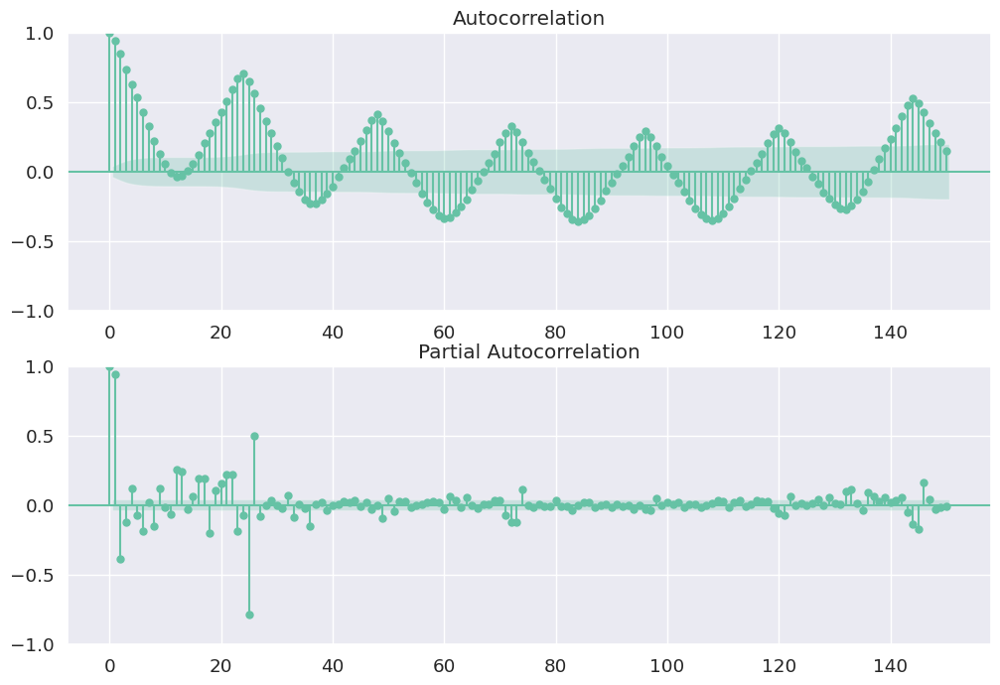

In [28]:
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(train_data, lags=150, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(train_data, lags=150, ax=ax2)
plt.show()

Видим в данных явный тренд, попробуем продифференцировать

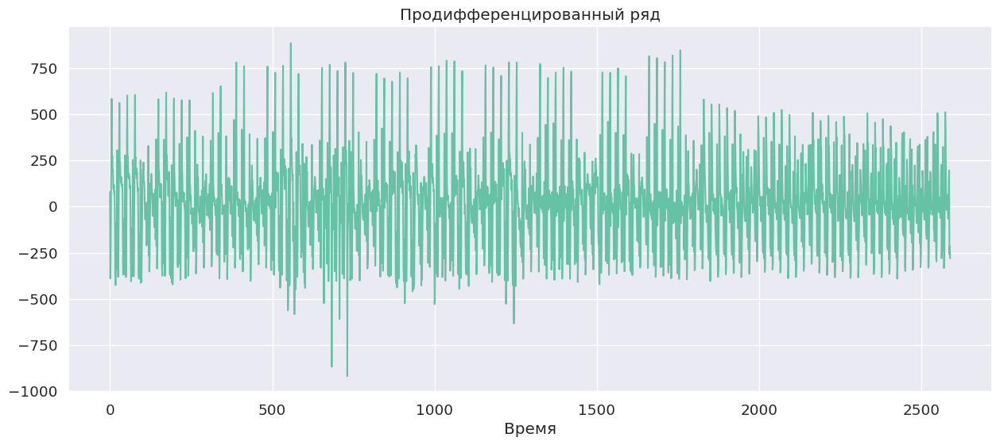

In [29]:
ya = np.array(train_data)
yt = ya[1:] - ya[:-1]  # дифференцирование

plt.figure(figsize=(15, 6))
plt.plot(yt)
plt.xlabel("Время")
plt.title("Продифференцированный ряд")
plt.show()

Посмторим на ACF и PACF для продифференцированного ряда

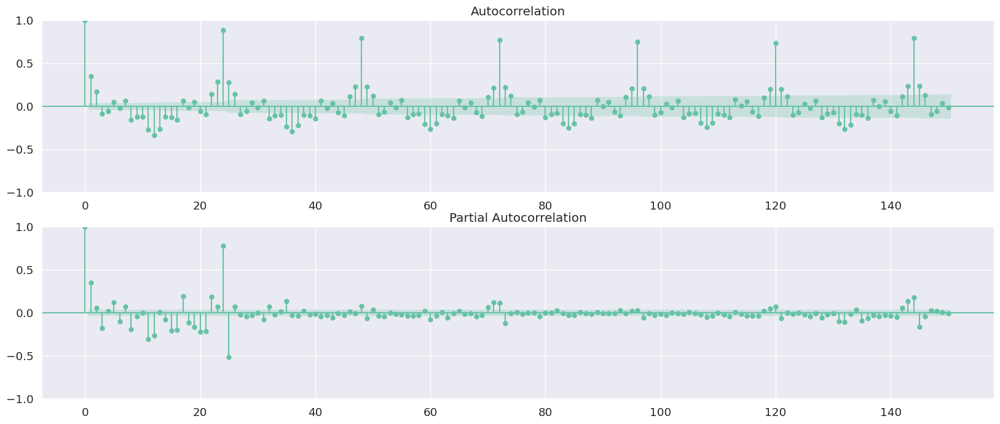

In [30]:
fig = plt.figure(figsize=(20, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(yt, lags=150, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(yt, lags=150, ax=ax2)
plt.ylim((-1, 1))
plt.show()

Небольшая сезонность все равно осталась, продифференцируем снова, причем сезонность мы знаем -- 24 часа, то есть сутки.

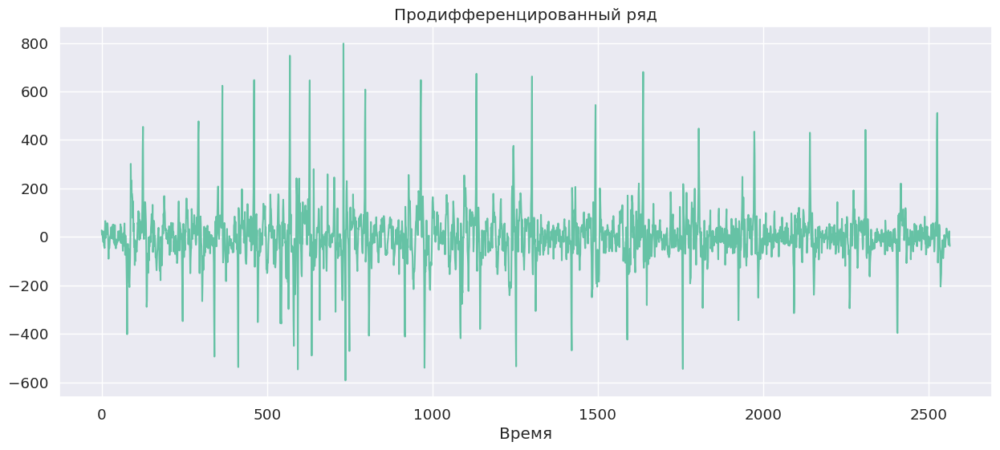

In [31]:
yt_24 = yt[24:] - yt[:-24]  # дифференцирование

plt.figure(figsize=(15, 6))
plt.plot(yt_24)
plt.xlabel("Время")
plt.title("Продифференцированный ряд")
plt.show()

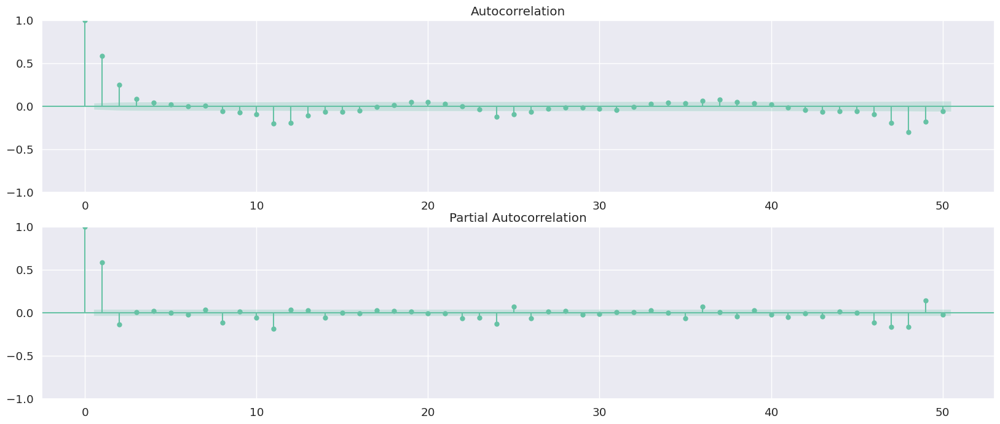

In [32]:
fig = plt.figure(figsize=(20, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(yt_24, lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(yt_24, lags=50, ax=ax2)
plt.ylim((-1, 1))
plt.show()

Отсюда получаем, исходя из номеров последних значимых лагов получаем, что q=4 и p=3.

__8.__  С помощью поиска по сетке вокруг выбранных параметров подберите оптимальные параметры по значению AIC. Учтите, что из сделанных ранее преобразований ряда нужно оставить лишь некоторые. Другие, например, одна из сезонностей будут учтены параметрами модели. Для вашего удобства рекомендуется сохранять промежуточные результаты, например, в какой-нибудь файл.

Сделаем полный перебор по сетке вокруг начальных значений параметров. Зададим сетку:

In [33]:
y = train_data[2390:] #2590
y.head()

Timestamp
2000-04-18 14:00:00    4562.575043
2000-04-18 15:00:00    4516.904782
2000-04-18 16:00:00    4520.406907
2000-04-18 17:00:00    4635.068635
2000-04-18 18:00:00    4866.145130
Freq: h, Name: Consumption, dtype: float64

In [34]:
p = range(1, 3)
q = range(1, 4)
d = [1]
P = range(6, 7)
D = [1]
Q = range(3, 4)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [
    (x[0], x[1], x[2], 24) for x in list(itertools.product(P, D, Q))
]

In [35]:
best_aic = np.inf
best_params = None

for param in tqdm(pdq):
    for param_seasonal in tqdm(seasonal_pdq, leave=False):
        try:
            model = sm.tsa.statespace.SARIMAX(
                y,
                order=param,
                seasonal_order=param_seasonal,
                # не будем требовать жесткие теоретические условия
                enforce_stationarity=False,
                enforce_invertibility=False,
            )
            model = model.fit(maxiter=50) 
            print(
                "ARIMA{}x{} – AIC: {:.2f}".format(
                    param, param_seasonal, model.aic
                )
            )

            # Если нашли более подходящую модель
            if model.aic < best_aic:
                best_aic = model.aic
                best_params = param, param_seasonal

        except:
            # Если модель построить не получится, то она выдаст исключение
            continue

  0%|          | 0/6 [00:00<?, ?it/s] This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.83870D-01    |proj g|=  8.04327D-02

At iterate    5    f=  7.61917D-01    |proj g|=  9.99839D-03

At iterate   10    f=  7.60649D-01    |proj g|=  2.14567D-03

At iterate   15    f=  7.57292D-01    |proj g|=  5.15224D-03

At iterate   20    f=  7.13519D-01    |proj g|=  1.17835D-01

At iterate   25    f=  6.92111D-01    |proj g|=  2.90048D-02

At iterate   30    f=  6.87834D-01    |proj g|=  7.23746D-03

At iterate   35    f=  6.87330D-01    |proj g|=  7.08443D-03

At iterate   40    f=  6.86872D-01    |proj g|=  4.72783D-03

At iterate   45    f=  6.85600D-01    |proj g|=  1.12941D-02


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.84644D-01    |proj g|=  4.11024D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   12     50     60      1     0     0   4.110D-03   6.846D-01
  F =  0.68464400907015555     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


 17%|█▋        | 1/6 [08:02<40:14, 483.00s/it]

ARIMA(1, 1, 1)x(6, 1, 3, 24) – AIC: 297.86


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.84847D-01    |proj g|=  3.54093D-02

At iterate    5    f=  7.63975D-01    |proj g|=  5.59006D-03

At iterate   10    f=  7.61151D-01    |proj g|=  2.14963D-03

At iterate   15    f=  7.58306D-01    |proj g|=  2.55344D-02

At iterate   20    f=  7.53237D-01    |proj g|=  1.55653D-02

At iterate   25    f=  7.27301D-01    |proj g|=  6.89103D-02

At iterate   30    f=  6.92156D-01    |proj g|=  3.83939D-02

At iterate   35    f=  6.83882D-01    |proj g|=  2.59153D-02

At iterate   40    f=  6.78350D-01    |proj g|=  9.27293D-03

At iterate   45    f=  6.78146D-01    |proj g|=  1.03242D-02


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.78061D-01    |proj g|=  4.83470D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     50     70      1     0     0   4.835D-04   6.781D-01
  F =  0.67806107912736080     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


 33%|███▎      | 2/6 [17:26<35:21, 530.34s/it]

ARIMA(1, 1, 2)x(6, 1, 3, 24) – AIC: 297.22


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           14     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.86566D-01    |proj g|=  3.59999D-02


 This problem is unconstrained.



At iterate    5    f=  7.65757D-01    |proj g|=  1.68732D-02

At iterate   10    f=  7.63206D-01    |proj g|=  4.76960D-03

At iterate   15    f=  7.60881D-01    |proj g|=  1.03255D-02

At iterate   20    f=  7.59428D-01    |proj g|=  1.08950D-02

At iterate   25    f=  7.40549D-01    |proj g|=  2.96483D-02

At iterate   30    f=  6.94854D-01    |proj g|=  2.61312D-02

At iterate   35    f=  6.84191D-01    |proj g|=  2.18405D-02

At iterate   40    f=  6.83290D-01    |proj g|=  1.75111D-03

At iterate   45    f=  6.82579D-01    |proj g|=  1.17790D-02


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.80485D-01    |proj g|=  2.14653D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   14     50     65      1     0     0   2.147D-02   6.805D-01
  F =  0.68048486885202664     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


 50%|█████     | 3/6 [26:24<26:42, 534.04s/it]

ARIMA(1, 1, 3)x(6, 1, 3, 24) – AIC: 300.19


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.57503D-01    |proj g|=  7.59766D-02

At iterate    5    f=  7.35409D-01    |proj g|=  3.61581D-03

At iterate   10    f=  7.33539D-01    |proj g|=  5.89411D-03

At iterate   15    f=  7.28481D-01    |proj g|=  6.05083D-03

At iterate   20    f=  7.24128D-01    |proj g|=  2.45296D-02

At iterate   25    f=  6.80894D-01    |proj g|=  6.68433D-02

At iterate   30    f=  6.61117D-01    |proj g|=  1.04780D-02

At iterate   35    f=  6.60883D-01    |proj g|=  4.21958D-03

At iterate   40    f=  6.60704D-01    |proj g|=  3.37550D-04

At iterate   45    f=  6.60702D-01    |proj g|=  2.32714D-04

At iterate   50    f=  6.60699D-01    |proj g|=  3.53281D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

 67%|██████▋   | 4/6 [33:59<16:45, 502.59s/it]

ARIMA(2, 1, 1)x(6, 1, 3, 24) – AIC: 290.28


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           14     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.57993D-01    |proj g|=  5.44548D-02


 This problem is unconstrained.



At iterate    5    f=  7.38771D-01    |proj g|=  1.19302D-02

At iterate   10    f=  7.35709D-01    |proj g|=  2.41591D-03

At iterate   15    f=  7.32235D-01    |proj g|=  1.27749D-02

At iterate   20    f=  7.21558D-01    |proj g|=  2.01206D-02

At iterate   25    f=  6.99868D-01    |proj g|=  5.88172D-02

At iterate   30    f=  6.85864D-01    |proj g|=  8.59730D-02

At iterate   35    f=  6.74515D-01    |proj g|=  4.83720D-02

At iterate   40    f=  6.64612D-01    |proj g|=  5.43425D-01

At iterate   45    f=  6.49592D-01    |proj g|=  1.33252D+00

At iterate   50    f=  6.44016D-01    |proj g|=  2.41188D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

 83%|████████▎ | 5/6 [40:09<07:35, 455.01s/it]

ARIMA(2, 1, 2)x(6, 1, 3, 24) – AIC: 285.61


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.59438D-01    |proj g|=  4.26932D-02

At iterate    5    f=  7.39729D-01    |proj g|=  1.07977D-02

At iterate   10    f=  7.37163D-01    |proj g|=  3.64143D-03

At iterate   15    f=  7.34244D-01    |proj g|=  3.47333D-03

At iterate   20    f=  7.28868D-01    |proj g|=  1.13990D-02

At iterate   25    f=  7.13807D-01    |proj g|=  4.06691D-02

At iterate   30    f=  6.99504D-01    |proj g|=  3.57026D-02

At iterate   35    f=  6.87107D-01    |proj g|=  3.05406D-02

At iterate   40    f=  6.79571D-01    |proj g|=  9.70065D-02

At iterate   45    f=  6.55431D-01    |proj g|=  1.07997D-01


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.51352D-01    |proj g|=  2.34077D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15     50     67      1     0     0   2.341D-02   6.514D-01
  F =  0.65135229210879719     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


100%|██████████| 6/6 [46:17<00:00, 462.95s/it]

ARIMA(2, 1, 3)x(6, 1, 3, 24) – AIC: 290.54


__9.__ Постройте прогнозы модели с оптимальными параметрами на неделю вперед. Посчитайте качество прогноза по сравнению с реальными данными на тестовом интервале, используя метрику MSE.

Возьмем лучшую модель и обучим ее.

In [36]:
param, param_seasonal = best_params
# param = (2, 1, 3)
# param_seasonal = (6, 1, 3, 24)
print("ARIMA{}x{}".format(param, param_seasonal))

ARIMA(2, 1, 2)x(6, 1, 3, 24)


In [37]:
model_path = "sarimax_model.pkl"

if os.path.exists(model_path):
    print("Загружаем сохранённую модель...")
    model = SARIMAXResults.load(model_path)
else:
    print("Файл модели не найден. Обучаем новую модель...")
    model = sm.tsa.statespace.SARIMAX(
        y,
        order=param,
        seasonal_order=param_seasonal,
        enforce_stationarity=False,
        enforce_invertibility=False,
    ).fit(maxiter=50) 
    
    model.save(model_path)
    print("Модель сохранена.")

print(model.summary().tables[1])

Файл модели не найден. Обучаем новую модель...


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           14     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.57993D-01    |proj g|=  5.44548D-02

At iterate    5    f=  7.38771D-01    |proj g|=  1.19302D-02

At iterate   10    f=  7.35709D-01    |proj g|=  2.41591D-03

At iterate   15    f=  7.32235D-01    |proj g|=  1.27749D-02

At iterate   20    f=  7.21558D-01    |proj g|=  2.01206D-02

At iterate   25    f=  6.99868D-01    |proj g|=  5.88172D-02

At iterate   30    f=  6.85864D-01    |proj g|=  8.59730D-02

At iterate   35    f=  6.74515D-01    |proj g|=  4.83720D-02

At iterate   40    f=  6.64612D-01    |proj g|=  5.43425D-01

At iterate   45    f=  6.49592D-01    |proj g|=  1.33252D+00


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.44016D-01    |proj g|=  2.41188D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   14     50     73      1     0     0   2.412D-01   6.440D-01
  F =  0.64401635770726395     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
Модель сохранена.
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3005      0.236      5.508      0.000       0.838       1.763
ar.L2         -0.9537      0.221     -4.321      0.000      -1.386      -0.521
ma.L1         -1.9588      

Сделаем предсказание на неделю вперед

In [38]:
pred_dynamic = model.get_prediction(
    start=start_date, end=end_date, dynamic=True, full_results=True
)
pred_mean = pred_dynamic.predicted_mean
pred_dynamic_ci = pred_dynamic.conf_int()

Посмотрим на предсказания

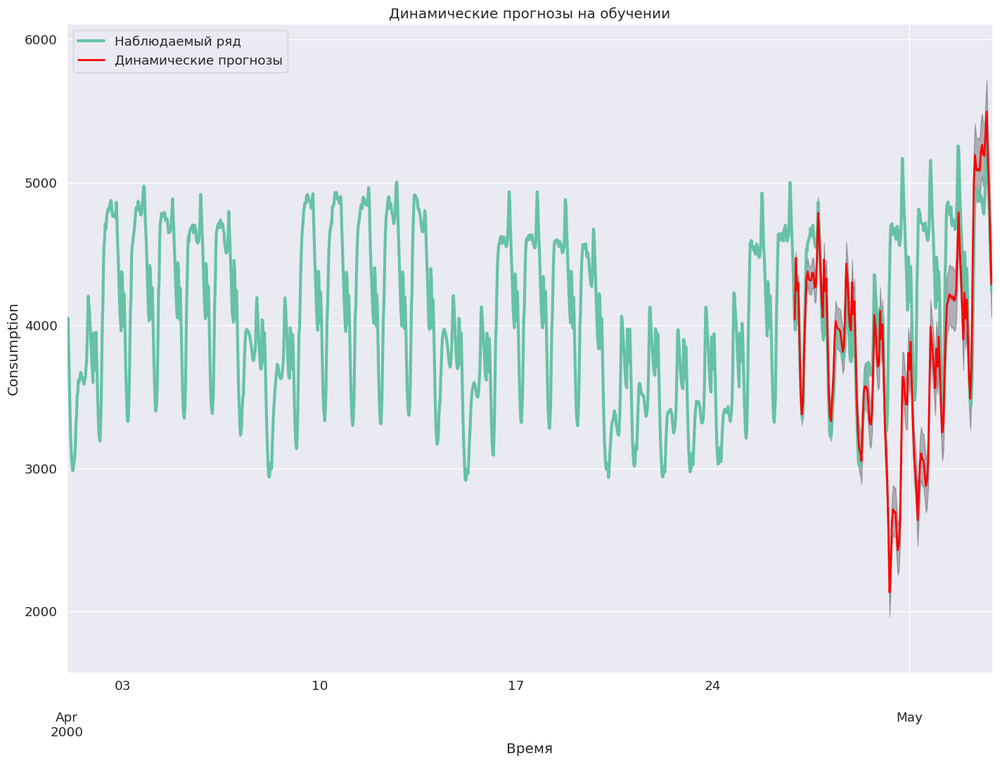

In [39]:
# временной ряд
ax = data["Consumption"]["2000-04":].plot(label="Наблюдаемый ряд", figsize=(17, 12), lw=3)

# прогнозы
pred_mean.plot(label="Динамические прогнозы", ax=ax, lw=2, color="red")
# предсказательный интервал
ax.fill_between(
    pred_dynamic_ci.index,
    pred_dynamic_ci.iloc[:, 0],
    pred_dynamic_ci.iloc[:, 1],
    color="k",
    alpha=0.25,
)

# область прогнозирования
ax.fill_betweenx(
    ax.get_ylim(),
    start_date,
    y.index[-1],
    alpha=0.1,
    zorder=-1,
)

ax.set_xlabel("Время")
ax.set_ylabel("Consumption")
plt.title("Динамические прогнозы на обучении")
plt.legend()
plt.show()

Посчитаем MSE

In [40]:
y_truth = test_data
mse = ((pred_mean - y_truth) ** 2).mean()
print("MSE = {:.3f}".format(mse))

MSE = 619768.071


__10.__ Добавьте в модель предсказания электричества экзогенные факторы:
* Значения температуры, используя на тестовом интервале времени истинные значения температуры (*нечестный способ*).
* Значения температуры, используя на тестовом интервале времени предсказания значений температуры. Предсказания можно получить с помощью модели Хольта-Уинтерса, `pmdarima.arima.auto_arima` или `statsforecast.models.AutoARIMA`.
* Использование значений температуры по частям &mdash; для получения прогноза $\widehat{y}_{T+h|T}$ строится своя модель по временному ряду $y_{h}, ..., y_T$ со сдвинутым влево рядом экзогенного фактора $x_{1}, ..., x_{T-h}$. Тогда для получения прогноза $\widehat{y}_{T+h|T}$ нужно знать значения $x_{T-h+1}, ..., x_{T}$, которые известны на момент построения модели.

1.

In [41]:
temprature_exog = data["Temperature"][y.index.min():start_date].resample("H").mean()

In [42]:
temprature_exog_test = data["Temperature"][start_date:].resample("H").mean()
start_date = temprature_exog_test.index.min()
end_date = temprature_exog_test.index.max()

temprature_exog_test = temprature_exog_test.values[:len(temprature_exog_test) - 1].reshape(-1, 1)

In [43]:
model_first = sm.tsa.statespace.SARIMAX(
    y,
    order=param,
    seasonal_order=param_seasonal,
    exog=temprature_exog.values.reshape(-1, 1),
    enforce_stationarity=False,
    enforce_invertibility=False,
).fit(maxiter=50)

print(model_first.summary().tables[1])

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.59895D-01    |proj g|=  4.59426D-02

At iterate    5    f=  7.39308D-01    |proj g|=  4.75782D-03

At iterate   10    f=  7.35813D-01    |proj g|=  3.72377D-03

At iterate   15    f=  7.34540D-01    |proj g|=  5.39358D-03

At iterate   20    f=  7.32324D-01    |proj g|=  5.40730D-03

At iterate   25    f=  7.29357D-01    |proj g|=  5.78854D-03

At iterate   30    f=  7.27058D-01    |proj g|=  1.00791D-02

At iterate   35    f=  7.19534D-01    |proj g|=  1.45804D-02

At iterate   40    f=  7.10658D-01    |proj g|=  3.30793D-02

At iterate   45    f=  7.04266D-01    |proj g|=  2.28181D-02


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.73977D-01    |proj g|=  1.03251D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15     50     59      1     0     0   1.033D-01   6.740D-01
  F =  0.67397655346225915     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            26.1973     29.082      0.901      0.368     -30.802      83.197
ar.L1          1.3312      0.179      7.418      0.000       0.979       1.683
ar.L2         -0.9566      0.137     -6.983  

In [44]:
pred_dynamic = model_first.get_prediction(
    start=start_date,
    end=end_date,
    dynamic=True,
    full_results=True,
    exog=temprature_exog_test,
)
pred_mean = pred_dynamic.predicted_mean
pred_dynamic_ci = pred_dynamic.conf_int()

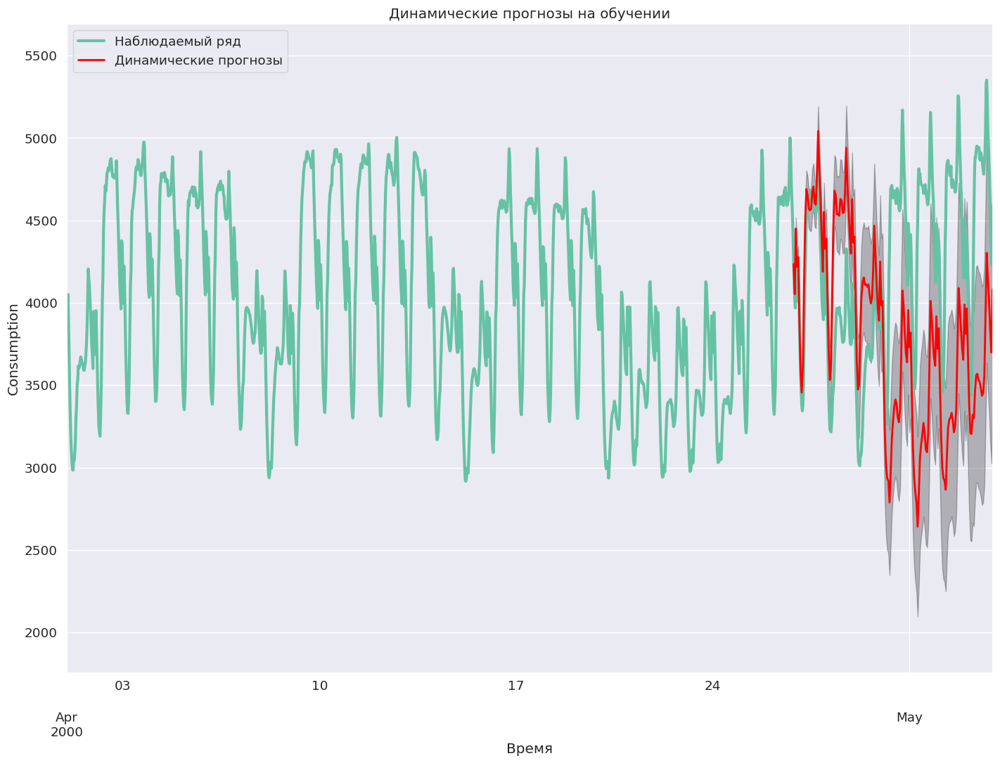

In [45]:
# временной ряд
ax = data["Consumption"]["2000-04":].plot(label="Наблюдаемый ряд", figsize=(17, 12), lw=3)

# прогнозы
pred_mean.plot(label="Динамические прогнозы", ax=ax, lw=2, color="red")
# предсказательный интервал
ax.fill_between(
    pred_dynamic_ci.index,
    pred_dynamic_ci.iloc[:, 0],
    pred_dynamic_ci.iloc[:, 1],
    color="k",
    alpha=0.25,
)

# область прогнозирования
ax.fill_betweenx(
    ax.get_ylim(),
    start_date,
    y.index[-1],
    alpha=0.1,
    zorder=-1,
)

ax.set_xlabel("Время")
ax.set_ylabel("Consumption")
plt.title("Динамические прогнозы на обучении")
plt.legend()
plt.show()

Снова посчитаем MSE

In [46]:
y_truth = test_data
mse = ((pred_mean - y_truth) ** 2).mean()
print("MSE = {:.3f}".format(mse))

MSE = 790151.144


2.
Я буду пользоваться предсказаниями модели Хольта-Уитнерса.

In [47]:
sf_fit_task10_2 = sf_models.HoltWinters(season_length=24, error_type="M").fit(
    temprature_exog
)
sf_fcast_task10_2_exog = sf_fit_task10_2.predict(temprature_exog_test.size)["mean"]

In [48]:
pred_dynamic = model_first.get_prediction(
    start=start_date,
    end=end_date,
    dynamic=True,
    full_results=True,
    exog=sf_fcast_task10_2_exog,
)
pred_mean = pred_dynamic.predicted_mean
pred_dynamic_ci = pred_dynamic.conf_int()

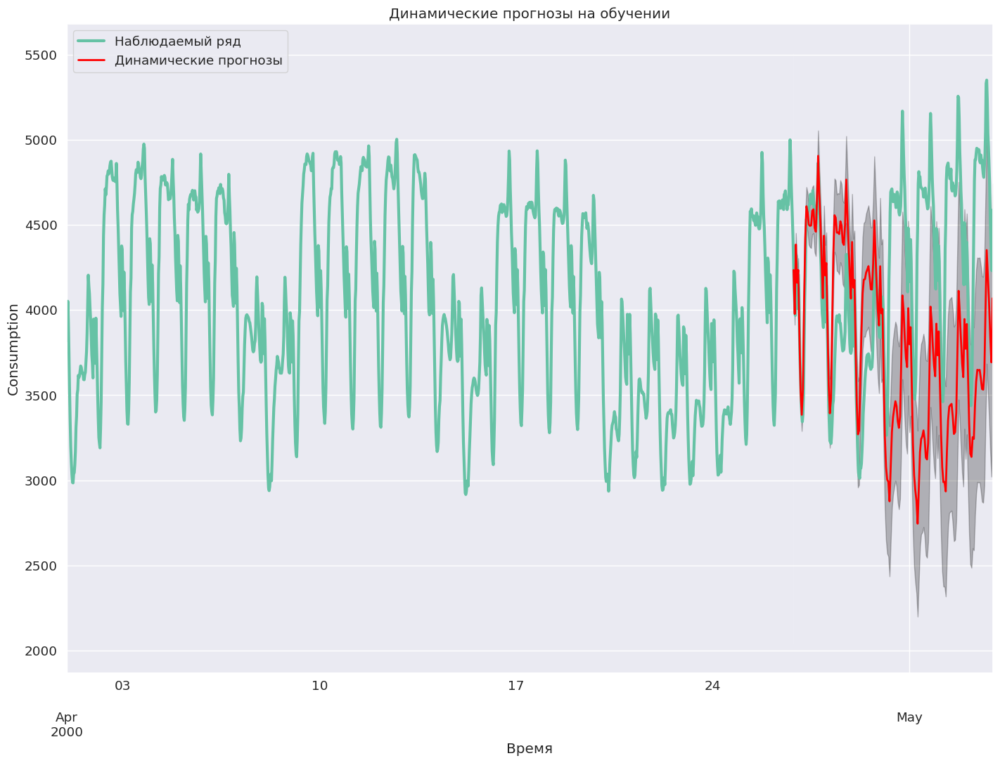

In [49]:
# временной ряд
ax = data["Consumption"]["2000-04":].plot(label="Наблюдаемый ряд", figsize=(17, 12), lw=3)

# прогнозы
pred_mean.plot(label="Динамические прогнозы", ax=ax, lw=2, color="red")
# предсказательный интервал
ax.fill_between(
    pred_dynamic_ci.index,
    pred_dynamic_ci.iloc[:, 0],
    pred_dynamic_ci.iloc[:, 1],
    color="k",
    alpha=0.25,
)

# область прогнозирования
ax.fill_betweenx(
    ax.get_ylim(),
    start_date,
    y.index[-1],
    alpha=0.1,
    zorder=-1,
)

ax.set_xlabel("Время")
ax.set_ylabel("Consumption")
plt.title("Динамические прогнозы на обучении")
plt.legend()
plt.show()

In [50]:
y_truth = test_data
mse = ((pred_mean - y_truth) ** 2).mean()
print("MSE = {:.3f}".format(mse))

MSE = 703991.721


3.

In [51]:
adopted_data = data.resample("H").mean()  # Ресемплирование данных по часам
H = 5  # Количество горизонтов прогнозирования
models = {}

for h in range(1, H + 1):
    y_train = y.iloc[h:]

    exog_train = adopted_data["Temperature"][
        y.index.min() + pd.Timedelta(hours=h) : y.index.max() + pd.Timedelta(hours=h)
    ].iloc[:-h]
    # display(y_train)
    # display(exog_train)
    # abort()
    tmp_model = sm.tsa.statespace.SARIMAX(
        y_train,
        order=param,
        seasonal_order=param_seasonal,
        exog=exog_train,
        enforce_stationarity=False,
        enforce_invertibility=False,
    ).fit(maxiter=50)

    models[h] = tmp_model

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.26274D-01    |proj g|=  2.56357D-02


 This problem is unconstrained.



At iterate    5    f=  7.14528D-01    |proj g|=  7.96461D-03

At iterate   10    f=  7.13803D-01    |proj g|=  8.23290D-03

At iterate   15    f=  7.10465D-01    |proj g|=  1.46303D-02

At iterate   20    f=  7.09144D-01    |proj g|=  6.91405D-03

At iterate   25    f=  6.99372D-01    |proj g|=  3.59688D-02

At iterate   30    f=  6.61787D-01    |proj g|=  6.02422D-02

At iterate   35    f=  6.51148D-01    |proj g|=  3.42859D-02

At iterate   40    f=  6.38870D-01    |proj g|=  5.66319D-02

At iterate   45    f=  6.35767D-01    |proj g|=  8.82209D-02

At iterate   50    f=  6.34146D-01    |proj g|=  1.16546D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.04149D-01    |proj g|=  2.25122D-02


 This problem is unconstrained.



At iterate    5    f=  6.92614D-01    |proj g|=  3.30471D-03

At iterate   10    f=  6.89975D-01    |proj g|=  2.36161D-03

At iterate   15    f=  6.88297D-01    |proj g|=  4.69705D-03

At iterate   20    f=  6.81542D-01    |proj g|=  5.57330D-02

At iterate   25    f=  6.73646D-01    |proj g|=  4.26686D-02

At iterate   30    f=  6.70676D-01    |proj g|=  1.87564D-01

At iterate   35    f=  6.70055D-01    |proj g|=  2.17659D-02

At iterate   40    f=  6.67681D-01    |proj g|=  6.84315D-02

At iterate   45    f=  6.64898D-01    |proj g|=  4.16163D-02


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.63811D-01    |proj g|=  1.64443D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15     50     63      1     0     0   1.644D-02   6.638D-01
  F =  0.66381089478829869     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.80843D-01    |proj g|=  2.20458D-02


 This problem is unconstrained.



At iterate    5    f=  6.69495D-01    |proj g|=  1.03996D-02

At iterate   10    f=  6.65840D-01    |proj g|=  1.05867D-02

At iterate   15    f=  6.64297D-01    |proj g|=  2.11626D-03

At iterate   20    f=  6.62565D-01    |proj g|=  4.60142D-03

At iterate   25    f=  6.44984D-01    |proj g|=  1.49536D-02

At iterate   30    f=  6.36473D-01    |proj g|=  4.27298D-02

At iterate   35    f=  6.31846D-01    |proj g|=  1.05721D-02

At iterate   40    f=  6.23036D-01    |proj g|=  6.09553D-02

At iterate   45    f=  6.10468D-01    |proj g|=  1.34835D-01


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  6.00865D-01    |proj g|=  5.37293D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15     50     71      1     0     0   5.373D-02   6.009D-01
  F =  0.60086545098104871     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.58865D-01    |proj g|=  2.34713D-02

At iterate    5    f=  6.45800D-01    |proj g|=  4.80832D-03

At iterate   10    f=  6.42911D-01    |proj g|=  3.32053D-03

At iterate   15    f=  6.42112D-01    |proj g|=  1.97926D-03

At iterate   20    f=  6.36759D-01    |proj g|=  2.95149D-02

At iterate   25    f=  6.28812D-01    |proj g|=  1.40212D-02

At iterate   30    f=  6.19661D-01    |proj g|=  1.25327D-02

At iterate   35    f=  6.14748D-01    |proj g|=  1.73202D-02

At iterate   40    f=  6.03913D-01    |proj g|=  2.54592D-02

At iterate   45    f=  5.61681D-01    |proj g|=  7.66783D-02


/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  5.41966D-01    |proj g|=  5.88889D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15     50     70      1     0     0   5.889D-02   5.420D-01
  F =  0.54196622654715310     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.35790D-01    |proj g|=  2.47479D-02

At iterate    5    f=  6.23640D-01    |proj g|=  1.59383D-02

At iterate   10    f=  6.20884D-01    |proj g|=  7.78633D-03

At iterate   15    f=  6.19919D-01    |proj g|=  1.90739D-03

At iterate   20    f=  6.17675D-01    |proj g|=  4.60991D-03

At iterate   25    f=  6.07394D-01    |proj g|=  1.18602D-02

At iterate   30    f=  5.89601D-01    |proj g|=  7.69483D-02

At iterate   35    f=  5.57521D-01    |proj g|=  6.20315D-02

At iterate   40    f=  5.46757D-01    |proj g|=  4.03792D-02

At iterate   45    f=  5.37831D-01    |proj g|=  5.65483D-02

At iterate   50    f=  5.22089D-01    |proj g|=  9.06226D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/home/alexander/.local/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [52]:
pred_means = {}
pred_cis = {}

for h in range(1, H + 1):
    # Подготовка экзогенных данных со сдвигом h
    exog_partial = (
        data["Temperature"][start_date:]
        .resample("H").mean()
        .shift(h)
        .dropna()
        .values.reshape(-1, 1)
    )
    # Получение предсказаний от модели с соответствующим h
    pred_dynamic = models[h].get_prediction(
        start=start_date,
        end=end_date  - pd.Timedelta(hours=h - 1),
        dynamic=True,
        full_results=True,
        exog=exog_partial
    )

    pred_means[h] = pred_dynamic.predicted_mean
    pred_cis[h] = pred_dynamic.conf_int()


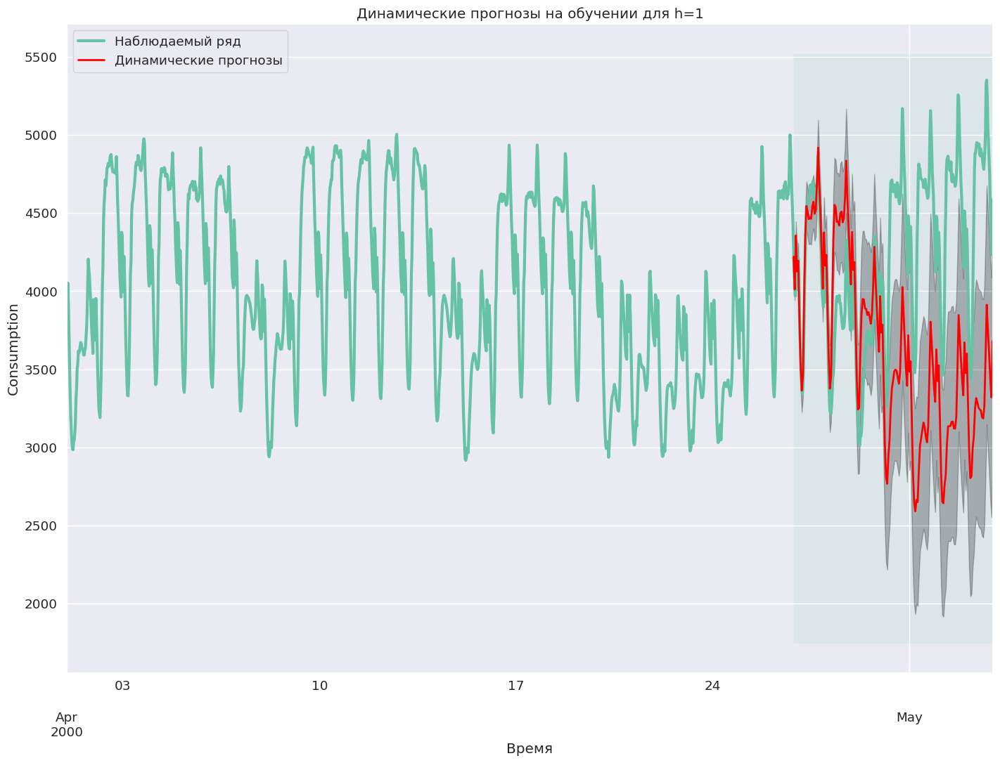

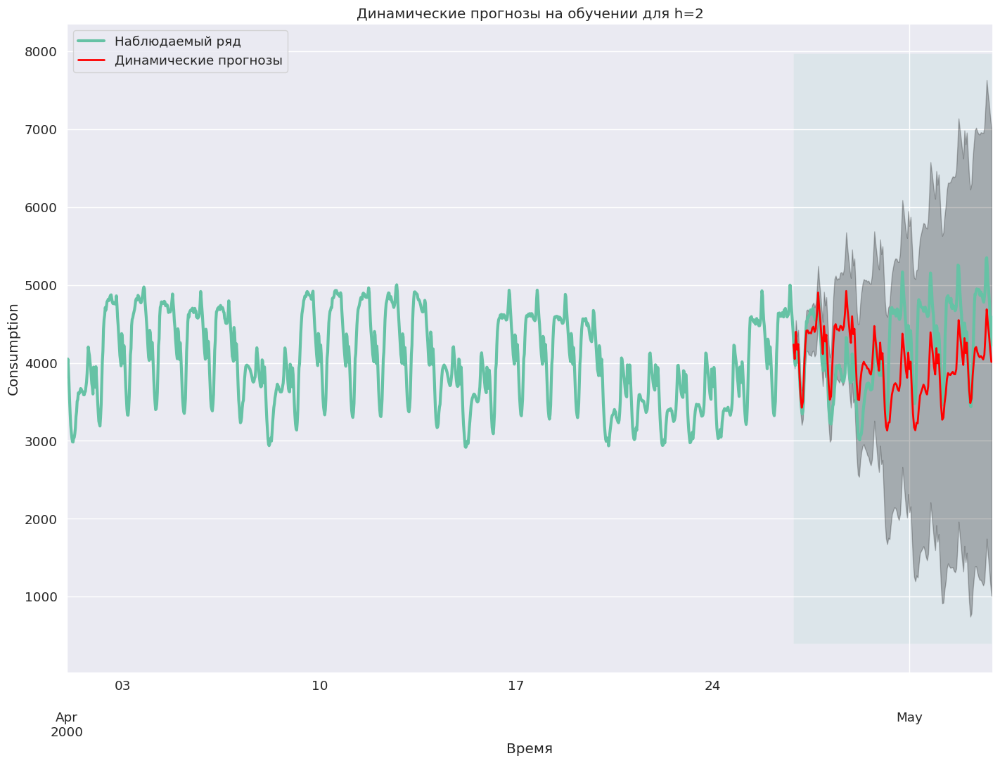

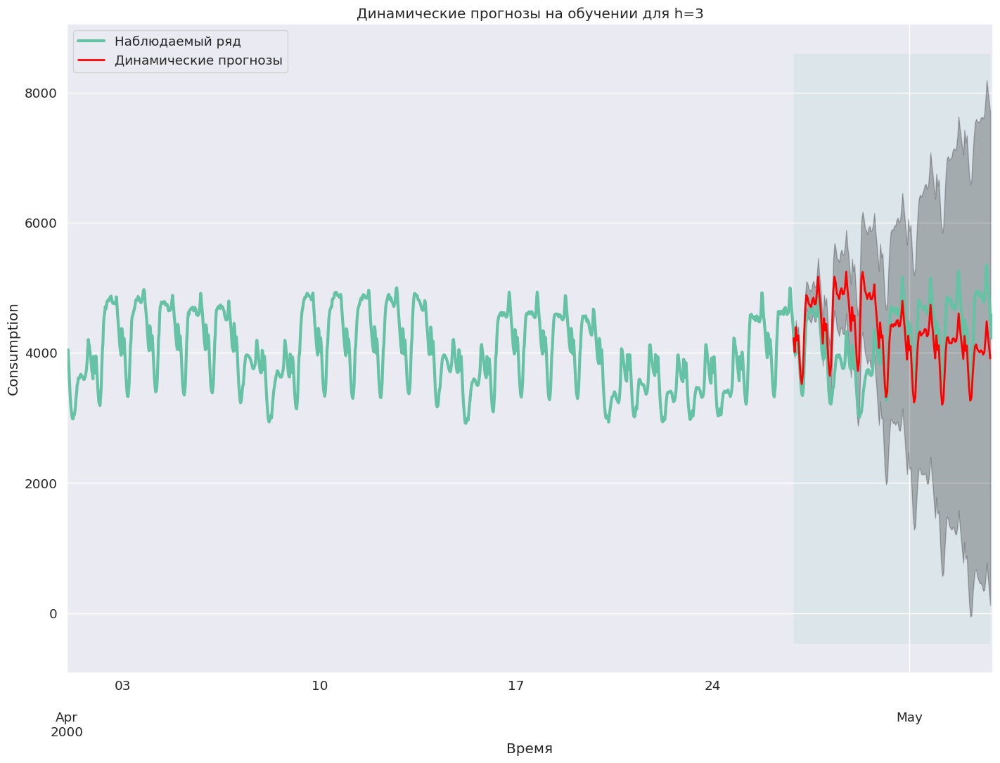

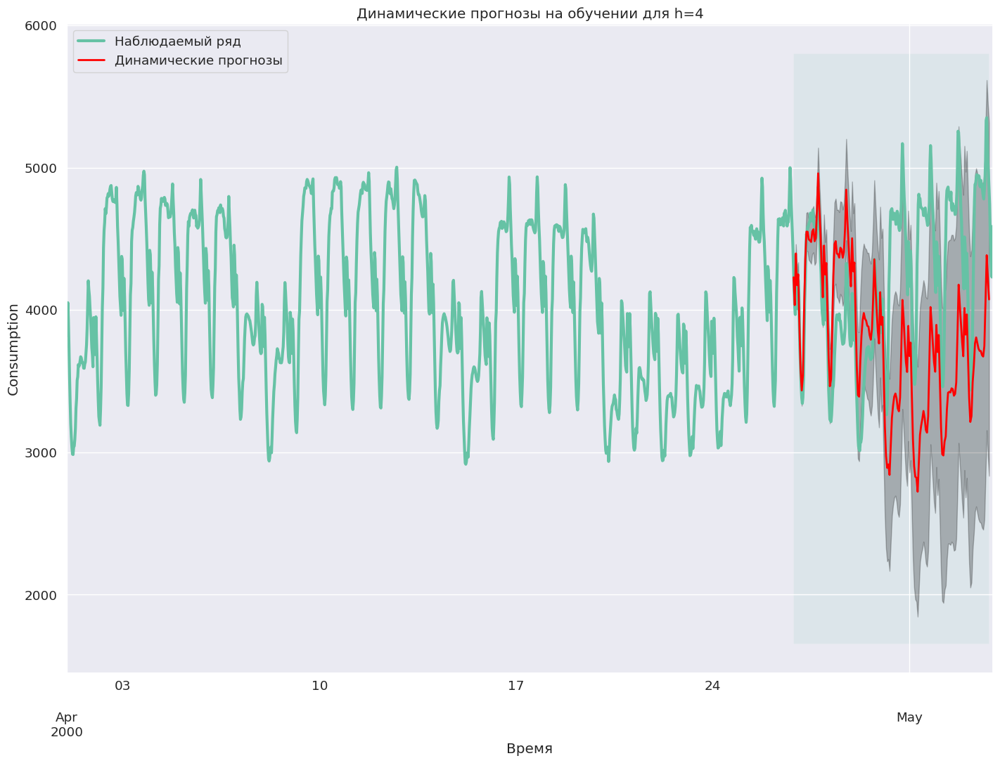

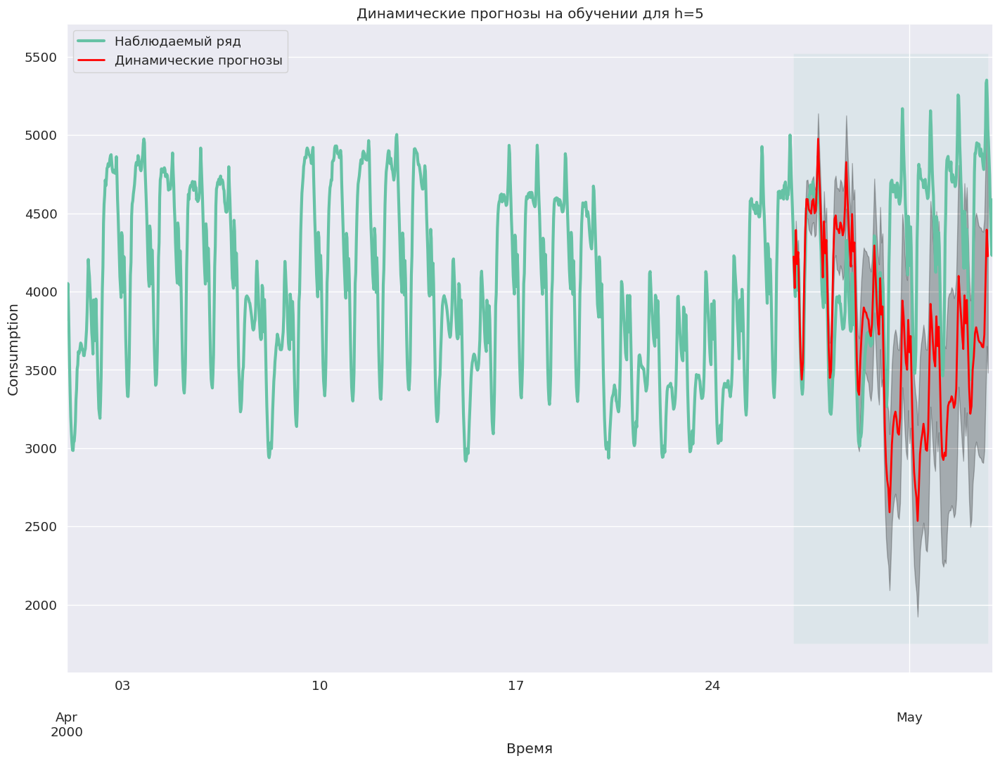

In [53]:
import matplotlib.pyplot as plt

# Проходим по всем возможным значениям h
for h in range(1, H + 1):
    # Подготовка фигуры
    fig, ax = plt.subplots(figsize=(17, 12))

    # Наблюдаемый временной ряд
    data["Consumption"]["2000-04":].plot(label="Наблюдаемый ряд", ax=ax, lw=3)

    # Прогнозы
    pred_mean = pred_means[h]
    pred_mean.plot(label="Динамические прогнозы", ax=ax, lw=2, color="red")

    # Доверительный интервал
    pred_dynamic_ci = pred_cis[h]
    ax.fill_between(
        pred_dynamic_ci.index,
        pred_dynamic_ci.iloc[:, 0],
        pred_dynamic_ci.iloc[:, 1],
        color="k",
        alpha=0.25,
    )

    # Область прогнозирования
    ax.fill_betweenx(
        ax.get_ylim(),
        start_date,
        pred_dynamic_ci.index[-1],
        alpha=0.1,
        zorder=-1,
    )

    # Настройка подписей и заголовков
    ax.set_xlabel("Время")
    ax.set_ylabel("Consumption")
    ax.set_title(f"Динамические прогнозы на обучении для h={h}")
    ax.legend()

    # Показать график
    plt.show()


In [67]:
mse_results = []

for h in range(1, H + 1):
    pred_mean = pred_means[h][:len(test_data)]
    true_values = test_data[:len(pred_mean)]
    mse = mean_squared_error(true_values, pred_mean)
    mse_results.append({"h": h, "MSE": int(mse)})
mse_df = pd.DataFrame(mse_results)

mse_df

,h,MSE
0,1,1004296
1,2,419332
2,3,446937
3,4,742194
4,5,872279


__11.__ Постройте предсказания временного ряда для электричества, используя библиотеку `prophet`. Визуализируйте предсказания и отдельные его компоненты.

In [68]:
data_train_prophet = data[["Consumption"]][data.index < start_date]
data_train_prophet.reset_index(inplace=True)
data_train_prophet.rename(columns={"Timestamp":"ds", "Consumption":"y"}, inplace=True)

data_test_prophet = data["Consumption"][data.index >= start_date]

data_train_prophet

,ds,y
0,2000-01-10 00:00:00,3853.475392
1,2000-01-10 00:30:00,3683.014105
2,2000-01-10 01:00:00,3912.324031
3,2000-01-10 01:30:00,3783.881181
4,2000-01-10 02:00:00,3554.257244
...,...,...
5173,2000-04-26 18:30:00,4909.304972
5174,2000-04-26 19:00:00,4747.700538
5175,2000-04-26 19:30:00,4646.963854
5176,2000-04-26 20:00:00,4540.091602


In [69]:
prophet_model = Prophet(interval_width=0.95)
prophet_model.fit(data_train_prophet)

14:43:33 - cmdstanpy - INFO - Chain [1] start processing
14:43:36 - cmdstanpy - INFO - Chain [1] done processing


In [70]:
def plot_results(
    y_to_train,
    y_to_test,
    y_forecast,
    plot_conf_int=True,
    left_bound=None,
    right_bound=None,
):
    """
    Функция для визуализации временного ряда и предсказания.

    Параметры:
        - y_to_train: pd.Series
            Временной ряд, на котором обучалась модель.
        - y_to_test: pd.Series
            Временной ряд, который предсказывает модель.
        - y_forecast: array
            Предсказания модели.
        - plot_conf_int: bool
            Надо ли строить предсказательного интервал.
        - left_bound: array
            Левая граница предсказательного интервала.
        - right_bound: array
            Правая граница предсказательного интервала.
    """

    plt.figure(figsize=(15, 8))
    plt.title("Потребление электроэнергии", fontsize=15)
    plt.plot(y_to_train["ds"], y_to_train["y"], label="train")
    plt.plot(y_to_test, label="test")
    plt.plot(y_to_test.index, y_forecast, label="prediction")
    if plot_conf_int:
        plt.fill_between(
            y_to_test.index,
            left_bound,
            right_bound,
            alpha=0.3,
            color="grey",
            label="conf.int",
        )
    plt.legend()
    plt.xlim(pd.Timestamp('2000-04-01'), y_to_test.index.max())
    plt.ylim(1800, 7000)
    plt.show()

In [71]:
future = prophet_model.make_future_dataframe(
    periods=48 * 7 + 6, freq='30min', include_history=False
)
y_prophet_forecast = prophet_model.predict(future)

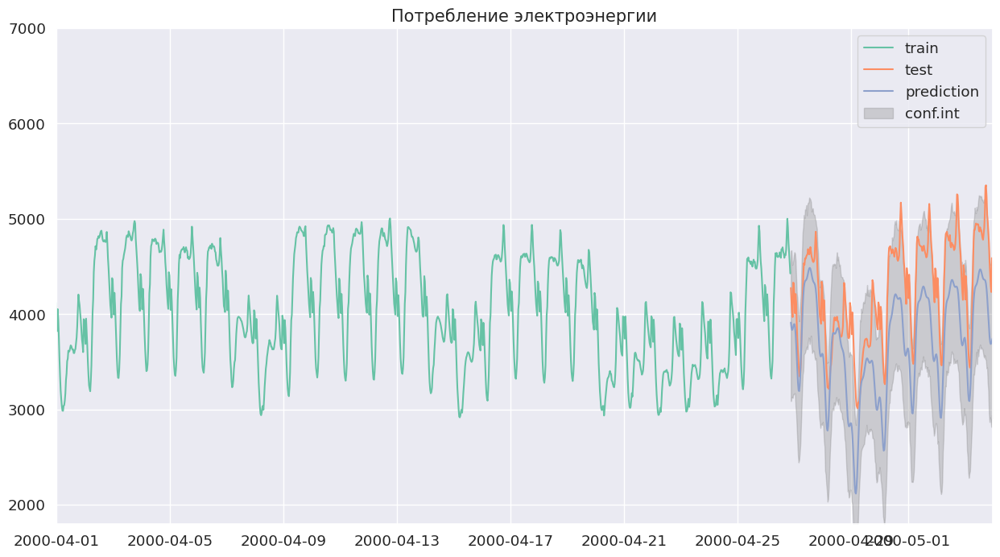

In [72]:
plot_results(
    data_train_prophet,
    data_test_prophet,
    y_prophet_forecast["yhat"],
    plot_conf_int=True,
    left_bound=y_prophet_forecast["yhat_lower"],
    right_bound=y_prophet_forecast["yhat_upper"],
)

In [73]:
compare_table = None


def add_results_in_comparison_table(
    method: str, y_true, y_forecast
) -> pd.DataFrame:
    """
    Добавляет новую строчку в таблицу compare_table с результатами текущей модели.
    Если ранее модель была уже добавлена в таблицу, то старая строчка перезапишется на новую.

    Параметры:
    - method: имя модели.
    - y_true: истинные значения.
    - y_forecast: предсказанные значения.
    """

    # Обращаемся к глобальной переменной
    global compare_table

    # Считаем метрики
    result_row = {
        "method": method,
        "MSE": mean_squared_error(y_true=y_true, y_pred=y_forecast),
        "MAE": mean_absolute_error(y_true=y_true, y_pred=y_forecast),
        "MAPE": mean_absolute_percentage_error(
            y_true=y_true, y_pred=y_forecast
        ),
    }

    # Записываем результат в таблицу
    if compare_table is None:
        compare_table = pd.DataFrame([result_row])
    else:
        if method in list(compare_table["method"]):
            compare_table = compare_table[compare_table["method"] != method]

        compare_table = pd.concat([compare_table, pd.DataFrame([result_row])])
        compare_table.index = np.arange(len(compare_table))
    return compare_table


def mean_absolute_percentage_error(y_true, y_pred) -> float:
    """Считает MAPE для y_true и y_pred"""

    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


In [74]:
add_results_in_comparison_table(
    "Prophet",data_test_prophet, y_prophet_forecast["yhat"]
)

,method,MSE,MAE,MAPE
0,Prophet,389585.250541,552.144521,13.027998


__12.__ Сравните все предсказания по метрике MSE. Какая модель оказалась лучшей? Сделайте выводы.

Выпишем итоги:

**Экспоненциальное сглаживание:**
- sm alpha=0.2:     402230
- sm alpha=0.6:     302825
- sm alpha=1:  	    286939

**Модель Хольта:**
- sf additive:        350430
- sf multiplicative:  350423

**Модель Хольта-Уинтерса:**
- sf additive:        171896
- sf multiplicative:  155533

**SARIMAX:**
- SARIMA(2, 1, 3)x(6, 1, 3, 24):  619768
- SARIMA(2, 1, 3)x(6, 1, 3, 24) + истинные значения температуры: 790151
- SARIMA(2, 1, 3)x(6, 1, 3, 24) + предсказанные значения температуры: 703991
- SARIMA(2, 1, 3)x(6, 1, 3, 24) + использование температуры по частям: 
\begin{array}{|c|c|}
\hline
h & MSE \\
\hline
1 & 1004296 \\
\hline
2 & 419332 \\
\hline
3 & 446937 \\
\hline
4 & 742194 \\
\hline
5 & 872279 \\
\hline
\end{array}

**Prophet:**
- Prophet:  389585

**Выводы**

Лучшей моделью оказалась модель Хольта-Уитнерса, за ней идет Prophet и замыкает стройку SARIMAX с экзогенными данными в виде частичных температур.

Хочется отметить, что обучение и подбор параметров в модели SARIMAX крайне время затратное мероприятие, в силу чего разумно использовать auto_arima.

Визуально, можно отметить, что SARIMAX дает не очень высокий результат, так как не успевает вовремя поменять тренд, также ее доверительные интервалы не выглядят убедительными.

Тем не менее модификации модели в пункте 3 отчасти исправляет эту проблему, и модель становится более адекватной.

Подводя итог, в данной задаче мы освоили основные модели и их модификации предсказания временных рядов и получили представление о качестве и времени их работы.